# Summarize models fit to natural populations

This notebook summarizes all metrics required for model comparison including the following:

  1. Standardized predictor distributions
  1. Model residuals by predictor
  1. Forecast errors overall and by timepoint
  1. Model coefficients averages and by timepoint
  
## Table of contents

 1. [Import and define functions](#Import-and-define-functions)
 1. [Define configuration settings](#Define-configuration-settings)
 1. [Load data](#Load-data)
 1. [Summarize predictors](#Summarize-predictors)
 1. [Summarize model residuals](#Summarize-model-residuals)
 1. [Summarize observed and predicted distances](#Summarize-observed-and-predicted-distances)
 1. [Summarize model forecasting error](#Summarize-model-forecasting-error)

## Import and define functions
[back to top](#Summarize-models)

In [9]:
import Bio.SeqIO
from collections import defaultdict
import glob
import json
import matplotlib as mpl
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import networkx as nx
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from scipy.stats import linregress
import seaborn as sns

%matplotlib inline

In [10]:
sns.set_style("white")
plt.style.use("huddlej")

In [11]:
mpl.rcParams['savefig.dpi'] = 200
mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['font.weight'] = 300
mpl.rcParams['axes.labelweight'] = 300
mpl.rcParams['font.size'] = 18

In [12]:
!pwd

/Users/jlhudd/projects/nextstrain/flu-forecasting/analyses


In [13]:
def mean_absolute_error(observed, estimated, **kwargs):
    """
    Calculates the mean absolute error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        mean absolute error between observed and estimated values
    """
    return np.mean(np.abs(observed - estimated))

def root_mean_square_error(observed, estimated, **kwargs):
    """
    Calculates the root mean square error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        root mean square error between observed and estimated values
    """
    return np.sqrt(np.mean((observed - estimated) ** 2))

def mean_square_error(observed, estimated, **kwargs):
    """
    Calculates the mean square error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        mean square error between observed and estimated values
    """
    return np.mean((observed - estimated) ** 2)

def facet_time_plot(data, value, value_label, timepoint_column="timepoint", predictors_column="predictors", hue=None,
                    height=4, aspect=1, col_order=None, col_wrap=4, markersize=15, grid_kwargs=None):
    if grid_kwargs is None:
        grid_kwargs = {}
        
    g = sns.FacetGrid(data, col=predictors_column, col_order=col_order, col_wrap=col_wrap, hue=hue, height=height, aspect=aspect, **grid_kwargs)
    g.map_dataframe(sns.lineplot, x=timepoint_column, y=value, estimator="mean", ci="sd", markers=True, dashes=False,
                   style=predictors_column, markersize=markersize)
    g.set_axis_labels("Date", value_label)

    for ax in g.axes.flatten():
        ax.axhline(y=0, color="#cccccc", zorder=-10)

        #start, end = [int(value) for value in ax.get_xlim()]
        #end = end + 1
        #stepsize = 2.0
        #ax.xaxis.set_ticks(np.arange(start, end, stepsize))

        #labels = ax.get_xticklabels()
        #output = plt.setp(labels, rotation=30)
        
    plt.gcf().autofmt_xdate()
    return g

## Define configuration settings
[back to top](#Summarize-models)

In [14]:
predictor_names_order = [
    "naive",
    "ep_x",
    "cTiter",
    "ne_star",
    "dms_star",
    "delta_frequency",
    "lbi",
    "ep_x-ne_star",
    "lbi-ep_x-ne_star"
]

In [15]:
"""predictor_names_order = [
    "naive",
    "ep_x",
    "cTiterSub_x",
    "ne_star",
    "dms_star",
    "lbi",
    "delta_frequency"
]

predictor_names_order = [
    "naive",
    "ep_x",
    "cTiter",
    "cTiterSub",
    "cTiterSub_star",
    "cTiterSub_x",
    "ne_star",
    "dms_star",
    "lbi",
    "delta_frequency",
    "ep_x-ne_star",
    "lbi-ne_star",
    "lbi-ep_x-ne_star"
]

#predictor_names_order = [
#    "naive",
#    "lbi"
#]"""

'predictor_names_order = [\n    "naive",\n    "ep_x",\n    "cTiterSub_x",\n    "ne_star",\n    "dms_star",\n    "lbi",\n    "delta_frequency"\n]\n\npredictor_names_order = [\n    "naive",\n    "ep_x",\n    "cTiter",\n    "cTiterSub",\n    "cTiterSub_star",\n    "cTiterSub_x",\n    "ne_star",\n    "dms_star",\n    "lbi",\n    "delta_frequency",\n    "ep_x-ne_star",\n    "lbi-ne_star",\n    "lbi-ep_x-ne_star"\n]\n\n#predictor_names_order = [\n#    "naive",\n#    "lbi"\n#]'

In [16]:
best_models = [
    "ep_x",
    "ne_star",
    "lbi",
    "lbi-ep_x-ne_star",
    "cTiterSub_x",
    "dms_star",
    "delta_frequency",
    "lbi-cTiterSub_x-dms_star"
]

best_predictor_names = [
    "epitope mutations",
    "non-epitope mutations",
    "LBI",
    "LBI and mutations",
    "HI phenotypes",
    "DMS phenotypes",
    "delta frequency",
    "LBI, HI, and DMS"
]

In [17]:
data_root = "../results/builds/h3n2/90_viruses_per_month/sample_0/2000-10-01--2015-10-01/"
data_root = "../results/builds/h3n2/1_viruses_per_month/sample_0/2000-10-01--2015-10-01/"
data_root = "../results/builds/h3n2/5_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

data_root = "../results/builds/h3n2/10_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

#data_root = "../results/builds/h3n2/30_viruses_per_month/sample_0/1994-10-01--2015-10-01/"
data_root = "../results/builds/natural/natural_sample_0_with_10_vpm/"

## Load data
[back to top](#Summarize-models)

In [18]:
tip_attributes_df = pd.read_table(data_root + "tip_attributes_with_weighted_distances.tsv", parse_dates=["timepoint"])

In [19]:
observed_weighted_distances = tip_attributes_df.loc[:, ["timepoint", "strain", "frequency", "weighted_distance_to_future"]].copy()

In [20]:
observed_weighted_distances["y"] = observed_weighted_distances["weighted_distance_to_future"]

In [21]:
model_jsons = glob.glob(data_root + "models_by_distances/*.json")

In [22]:
models_by_predictors = {}

for model_json in model_jsons:
    with open(model_json, "r") as fh:
        data = json.load(fh)
        models_by_predictors["-".join(data["predictors"])] = data

In [23]:
models_by_predictors["lbi"]["cost_function"]

'diffsum'

In [24]:
models_by_predictors["lbi"]["l1_lambda"]

0.01

In [25]:
models_by_predictors["lbi"]["training_window"]

6

In [26]:
models_by_predictors["lbi"]["pseudocount"]

In [27]:
type(models_by_predictors["lbi"])

dict

In [28]:
sorted(models_by_predictors.keys())

['cTiter',
 'delta_frequency',
 'dms_star',
 'ep_x',
 'ep_x-ne_star',
 'lbi',
 'lbi-ep_x-ne_star',
 'naive',
 'ne_star']

In [29]:
models_by_predictors["lbi"].keys()

dict_keys(['scores', 'predictors', 'cv_error_mean', 'cv_error_std', 'coefficients_mean', 'coefficients_std', 'mean_stds_mean', 'mean_stds_std', 'cost_function', 'l1_lambda', 'delta_months', 'training_window', 'pseudocount'])

In [30]:
models_by_predictors["lbi"]["scores"][0].keys()

dict_keys(['predictors', 'training_data', 'training_n', 'training_error', 'coefficients', 'mean_stds', 'validation_data', 'validation_n', 'validation_error', 'last_training_timepoint', 'validation_timepoint'])

In [31]:
models_by_predictors["lbi"]["scores"][0]["training_n"]

268

In [32]:
models_by_predictors["lbi"]["scores"][0]["validation_data"].keys()

dict_keys(['y', 'y_hat'])

In [33]:
models_by_predictors["lbi"]["scores"][0]["coefficients"]

[1.052251321281977]

In [34]:
models_by_predictors["lbi"]["scores"][0]["mean_stds"]

[0.1275747369503312]

In [35]:
len(models_by_predictors["lbi"]["scores"])

25

Build data frames for plotting from the model scores.

In [36]:
overall_errors = []
errors_by_time = []
overall_coefficients = []
coefficients_by_time = []
mean_stds_by_time = []
frequency_dfs = []
residuals_dfs = []

for predictors, model in models_by_predictors.items():
    overall_errors.append({
        "predictors": predictors,
        "cv_error_mean": model["cv_error_mean"],
        "cv_error_std": model["cv_error_std"]
    })

    for predictor, mean, std in zip(model["predictors"], model["coefficients_mean"], model["coefficients_std"]):
        overall_coefficients.append({
            "predictors": predictors,
            "predictor": predictor,
            "mean": mean,
            "std": std
        })
    
    for scores in model["scores"]:
        errors_by_time.append({
            "predictors": predictors,
            "validation_timepoint": pd.to_datetime(scores["validation_timepoint"]),
            "validation_error": scores["validation_error"],
            "validation_n": scores["validation_n"]
        })
        
        for predictor, coefficient, mean_std in zip(model["predictors"], scores["coefficients"], scores["mean_stds"]):
            coefficients_by_time.append({
                "predictors": predictors,
                "predictor": predictor,
                "coefficient": coefficient,
                "validation_timepoint": pd.to_datetime(scores["validation_timepoint"])
            })
            
            mean_stds_by_time.append({
                "predictors": predictors,
                "predictor": predictor,
                "mean_std": mean_std,
                "validation_timepoint": scores["validation_timepoint"]
            })
        
        #X = pd.DataFrame(scores["validation_data"]["X"])
        #X["timepoint"] = pd.to_datetime(X["timepoint"])

        y = pd.DataFrame(scores["validation_data"]["y"])
        y["timepoint"] = pd.to_datetime(y["timepoint"])
        y["future_timepoint"] = pd.to_datetime(y["future_timepoint"])

        y_hat = pd.DataFrame(scores["validation_data"]["y_hat"])
        y_hat["timepoint"] = pd.to_datetime(y_hat["timepoint"])

        frequency_df = y_hat.merge(
            observed_weighted_distances,
            on=["timepoint", "strain", "frequency"],
            suffixes=["_hat", ""]
        )
        frequency_df["residual"] = frequency_df["y"] - frequency_df["y_hat"]
        frequency_df["validation_timepoint"] = pd.to_datetime(scores["validation_timepoint"])
        frequency_df["predictors"] = predictors
        frequency_dfs.append(frequency_df)

        #training_X = pd.DataFrame(scores["training_data"]["X"])
        #training_X["timepoint"] = pd.to_datetime(training_X["timepoint"])

        training_y = pd.DataFrame(scores["training_data"]["y"])
        training_y["timepoint"] = pd.to_datetime(training_y["timepoint"])
        training_y_hat = pd.DataFrame(scores["training_data"]["y_hat"])
        training_y_hat["timepoint"] = pd.to_datetime(training_y_hat["timepoint"])
        residual_df = training_y_hat.merge(
            observed_weighted_distances,
            on=["timepoint", "strain", "frequency"],
            suffixes=["_hat", ""]
        )
        residual_df["residual"] = residual_df["y"] - residual_df["y_hat"]
        residual_df["validation_timepoint"] = pd.to_datetime(scores["validation_timepoint"])
        residual_df["predictors"] = predictors

        residuals_dfs.append(residual_df)
        
overall_errors_df = pd.DataFrame(overall_errors)
errors_by_time_df = pd.DataFrame(errors_by_time)
overall_coefficients_df = pd.DataFrame(overall_coefficients)
coefficients_by_time_df = pd.DataFrame(coefficients_by_time)
mean_stds_by_time_df = pd.DataFrame(mean_stds_by_time)
frequency_df = pd.concat(frequency_dfs, ignore_index=True)
residual_df = pd.concat(residuals_dfs, ignore_index=True)

In [37]:
frequency_df.head()

,fitness,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
0,-0.666988,0.034740,0.013621,A/Auckland/608/2002,2002-10-01,19.048754,6.852277,9.576228,19.048754,19.048754,9.472526,2002-10-01,dms_star
1,-0.096415,0.026914,0.018671,A/Auckland/611/2002,2002-10-01,19.056732,6.322624,9.091628,19.056732,19.056732,9.965104,2002-10-01,dms_star
2,-0.515448,0.000195,0.000089,A/Auckland/614/2002,2002-10-01,19.930955,7.635063,10.377529,19.930955,19.930955,9.553426,2002-10-01,dms_star
3,-0.005720,0.006197,0.004707,A/Auckland/615/2002,2002-10-01,19.928664,7.664781,10.428715,19.928664,19.928664,9.499949,2002-10-01,dms_star
4,0.244552,0.027860,0.027180,A/Canterbury/1/2002,2002-10-01,18.056737,5.376456,8.128970,18.056737,18.056737,9.927767,2002-10-01,dms_star


In [38]:
residual_df.head()

,fitness,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
0,-1.090955,0.004796,0.001901,A/Geneva/A9509/1995,1995-10-01,14.447385,8.089246,9.321813,14.447385,14.447385,5.125572,2002-10-01,dms_star
1,-0.140551,0.156765,0.160702,A/HongKong/49/1995,1995-10-01,10.684317,6.237606,7.020076,10.684317,10.684317,3.664241,2002-10-01,dms_star
2,-1.136816,0.186688,0.070667,A/Malaysia/7145/1995,1995-10-01,14.717898,7.793516,10.300757,14.717898,14.717898,4.417141,2002-10-01,dms_star
3,0.311233,0.103236,0.166269,A/Malaysia/7831/1995,1995-10-01,6.944227,8.604047,9.032109,6.944227,6.944227,-2.087882,2002-10-01,dms_star
4,-0.571843,0.103236,0.068754,A/Malaysia/7832/1995,1995-10-01,16.605693,10.340932,12.892012,16.605693,16.605693,3.713681,2002-10-01,dms_star


In [39]:
residual_df.shape

(239688, 13)

In [40]:
overall_errors_df.sort_values("cv_error_mean")

,cv_error_mean,cv_error_std,predictors
1,0.018555,0.248610,lbi
2,0.085244,0.232563,lbi-ep_x-ne_star
5,0.112806,0.181989,delta_frequency
0,0.174912,0.230039,dms_star
3,0.208895,0.292942,ne_star
8,0.241559,0.159610,naive
4,0.252660,0.273430,ep_x-ne_star
6,0.268414,0.272912,cTiter
7,0.285034,0.199574,ep_x


## Summarize predictors
[back to top](#Summarize-models)

In [41]:
individual_predictor_names_order = [
    predictor
    for predictor in predictor_names_order
    if not "-" in predictor and predictor != "naive"
]

In [42]:
individual_predictor_names_order

['ep_x', 'cTiter', 'ne_star', 'dms_star', 'delta_frequency', 'lbi']

In [43]:
long_predictors_df = tip_attributes_df.melt(
    id_vars=["strain", "timepoint"],
    value_vars=individual_predictor_names_order,
    var_name="predictor",
    value_name="predictor_value"
)

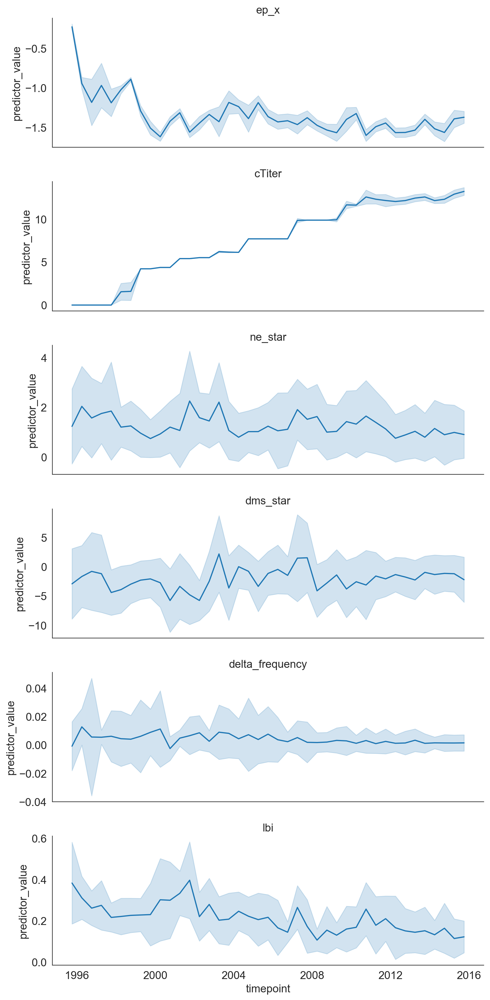

In [44]:
g = sns.FacetGrid(long_predictors_df, row="predictor", aspect=3, sharey=False,
                  row_order=individual_predictor_names_order)
g.map(sns.lineplot, "timepoint", "predictor_value", ci="sd")
g.set_titles("{row_name}")

plt.savefig("../manuscript/figures/predictors_by_timepoint.pdf")

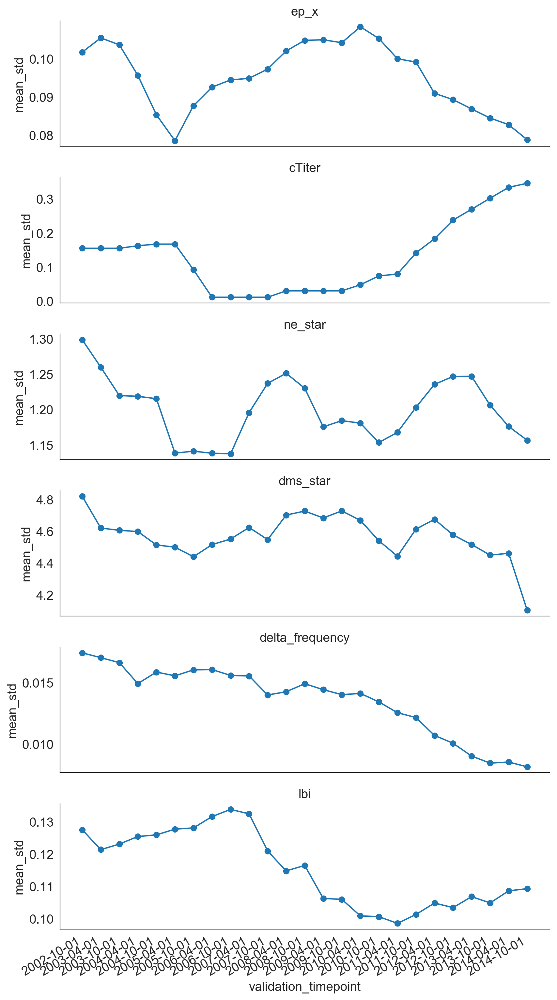

In [45]:
g = sns.FacetGrid(
    mean_stds_by_time_df[mean_stds_by_time_df["predictors"].isin(individual_predictor_names_order)],
    row="predictor",
    row_order=individual_predictor_names_order,
    aspect=3,
    sharey=False
)
g.map(plt.plot, "validation_timepoint", "mean_std", marker="o")
g.set_titles("{row_name}")

plt.gcf().autofmt_xdate()

In [46]:
"""variables_to_plot = [predictor for predictor in predictor_names_order if not "-" in predictor] + ["frequency"]
sns.pairplot(tip_attributes_df.dropna(), vars=variables_to_plot, diag_kind="hist", diag_kws={"bins": 20})"""

'variables_to_plot = [predictor for predictor in predictor_names_order if not "-" in predictor] + ["frequency"]\nsns.pairplot(tip_attributes_df.dropna(), vars=variables_to_plot, diag_kind="hist", diag_kws={"bins": 20})'

In [47]:
tip_attributes_df.loc[pd.isnull(tip_attributes_df["ep_x"]), ["strain", "timepoint", "frequency"]]

,strain,timepoint,frequency


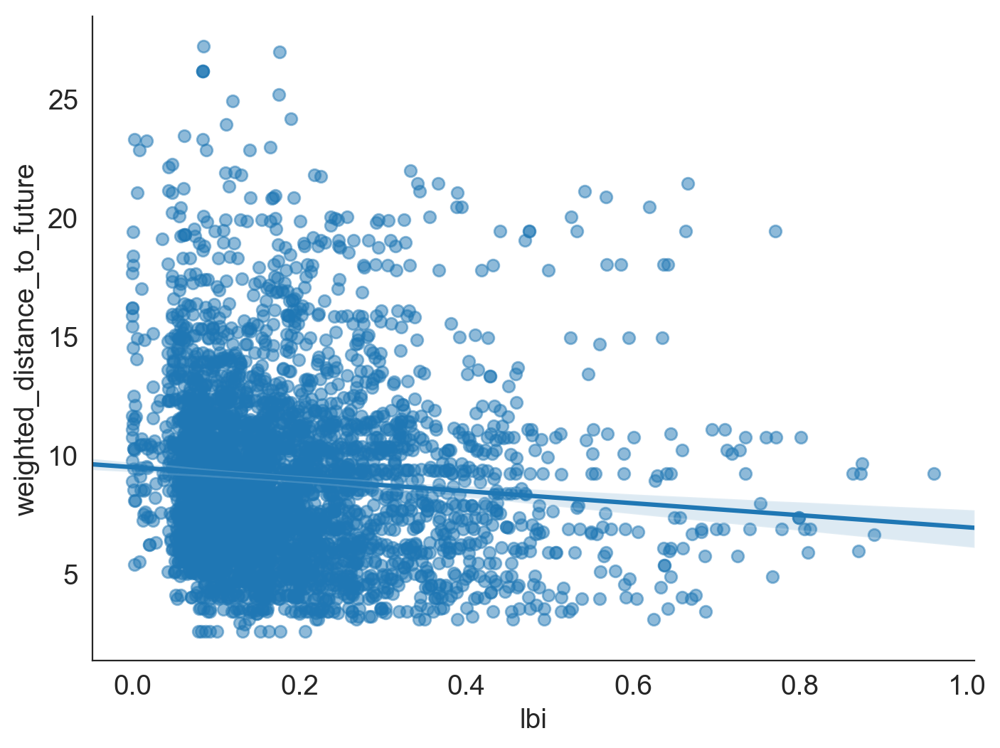

In [48]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("lbi", "weighted_distance_to_future", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

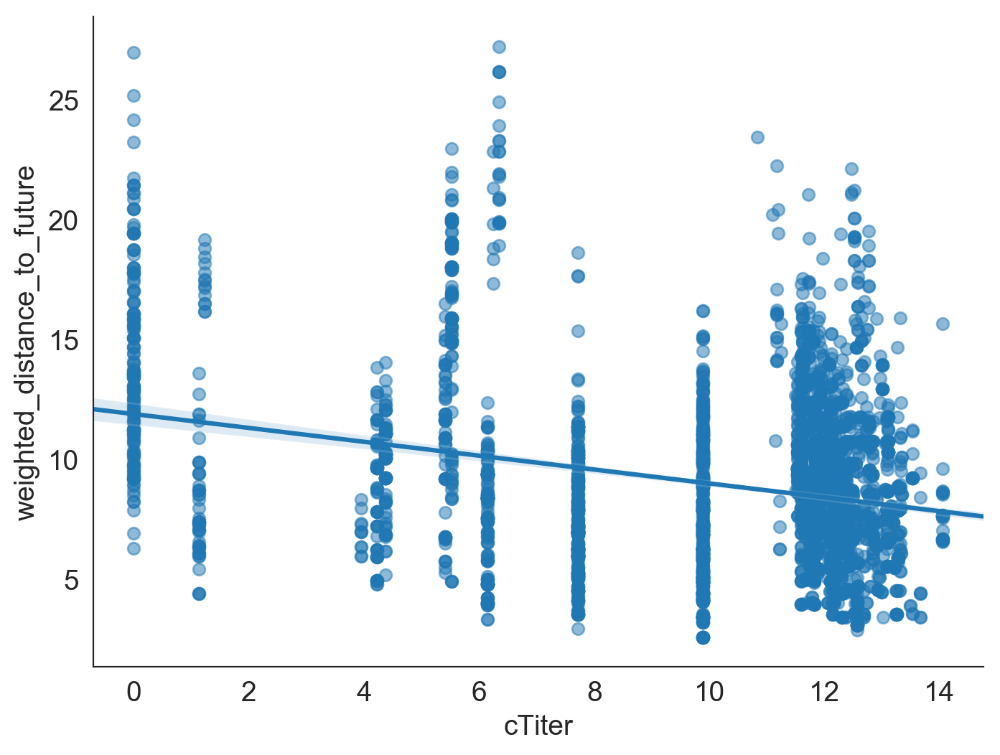

In [49]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("cTiter", "weighted_distance_to_future", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

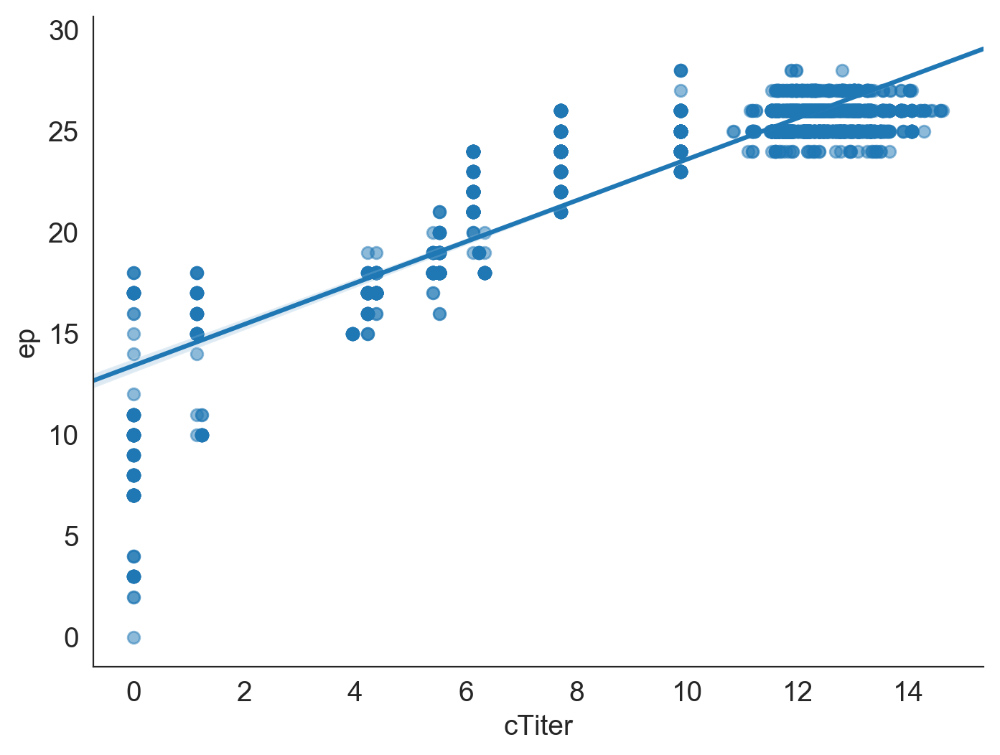

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("cTiter", "ep", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

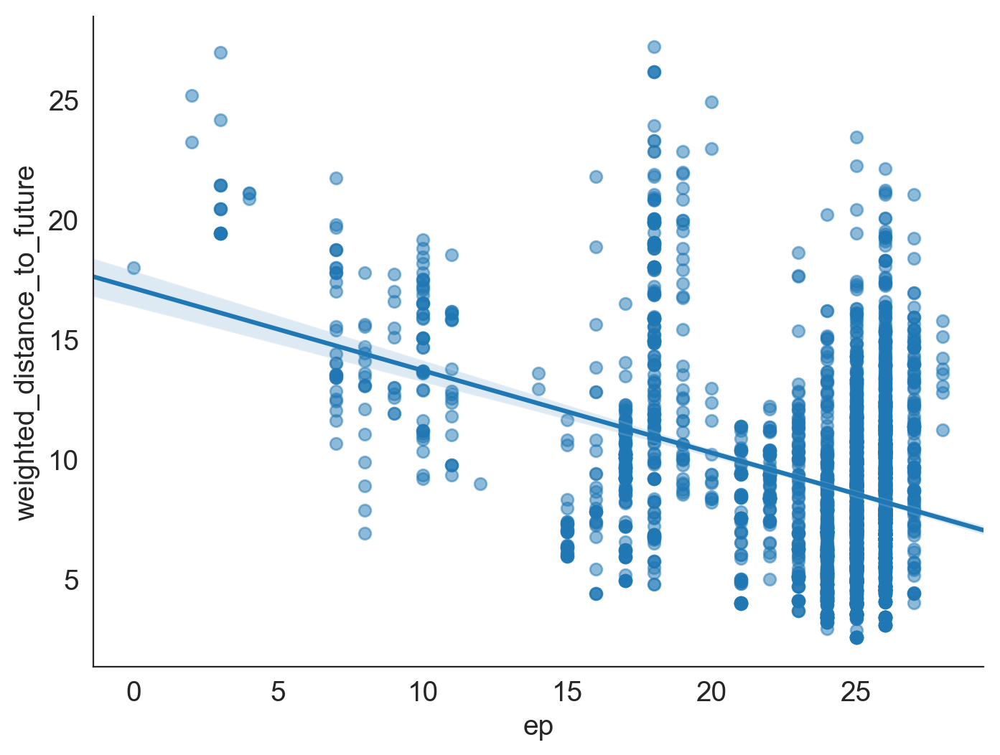

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("ep", "weighted_distance_to_future", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

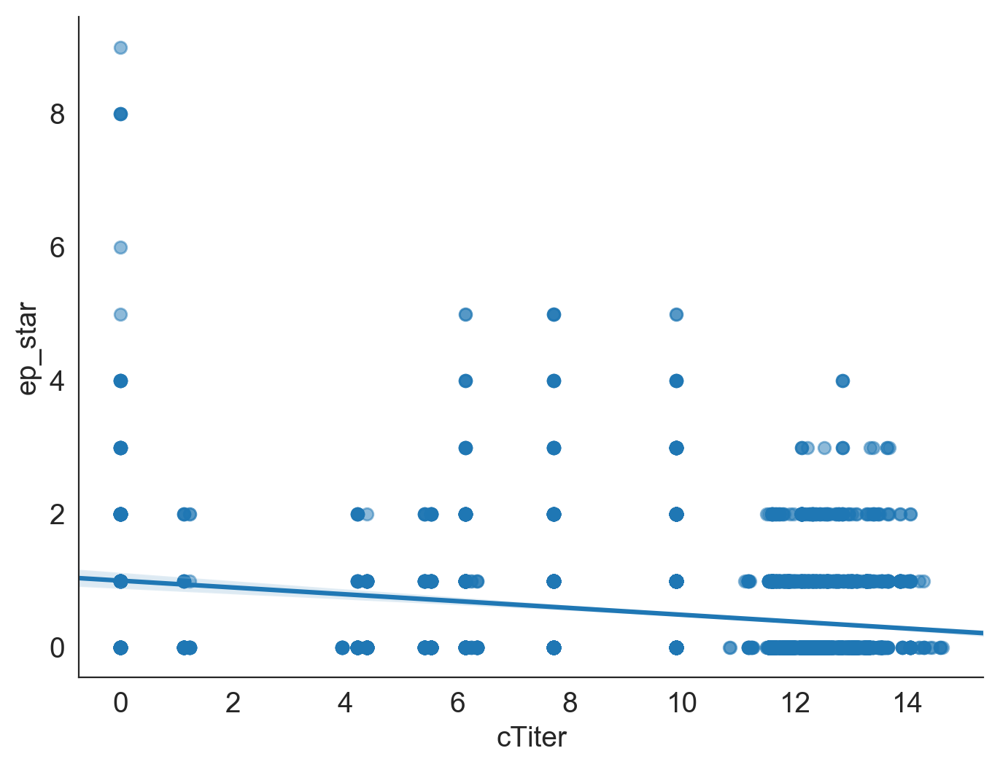

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("cTiter", "ep_star", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

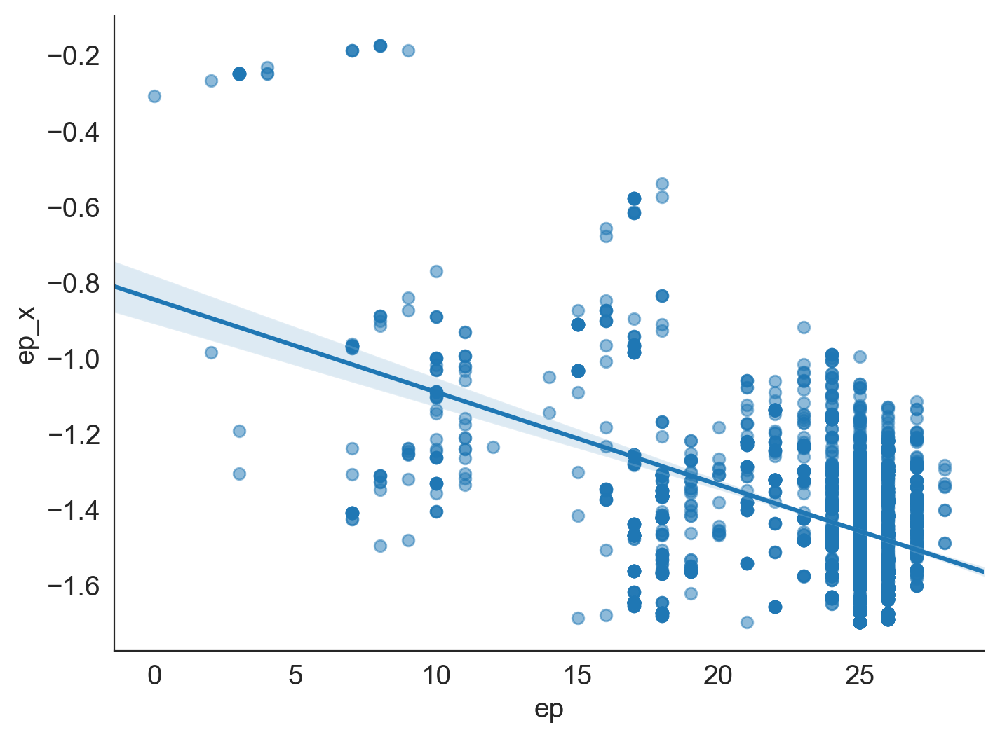

In [53]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("ep", "ep_x", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

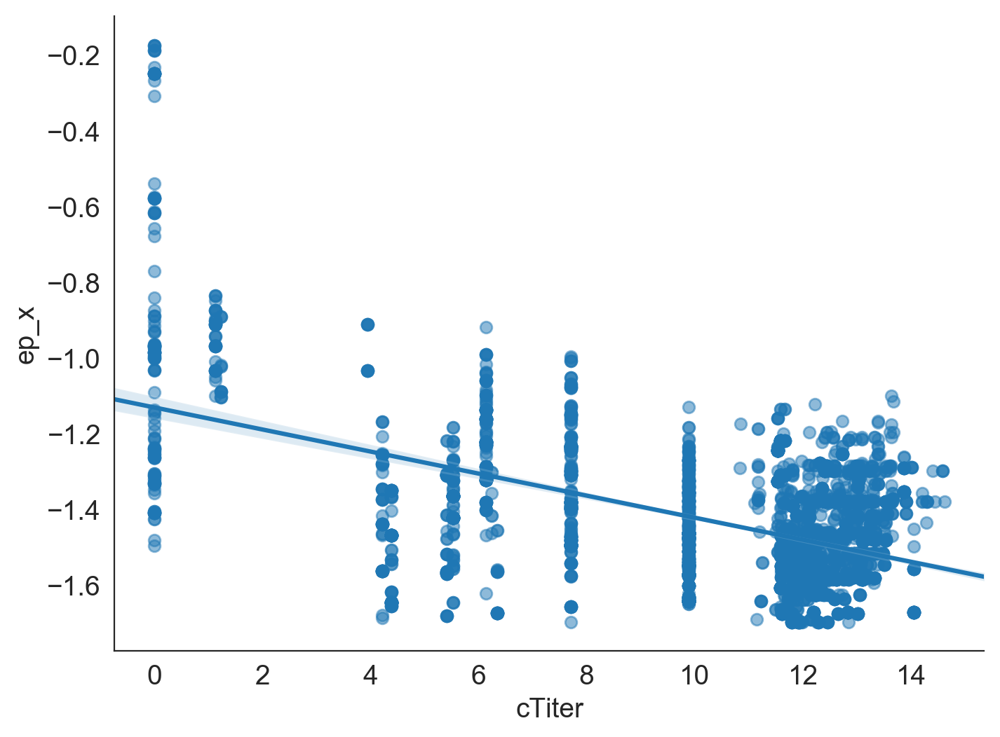

In [54]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("cTiter", "ep_x", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

In [55]:
d_ep = np.arange(0, 21)

In [56]:
d_init = 14.0

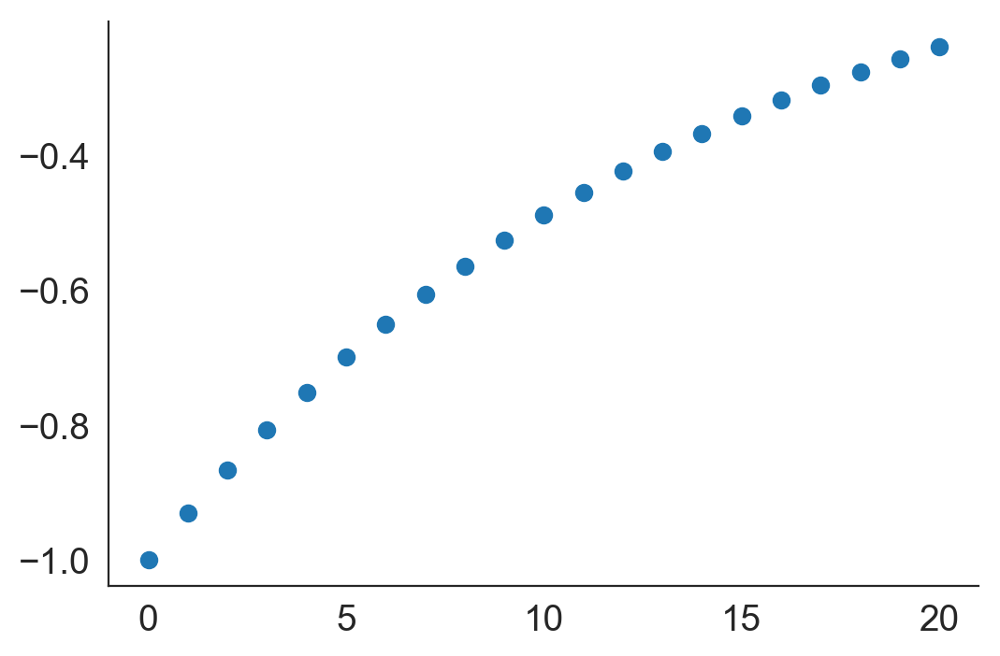

In [57]:
plt.plot(d_ep, -np.exp(-d_ep / float(d_init)), "o")

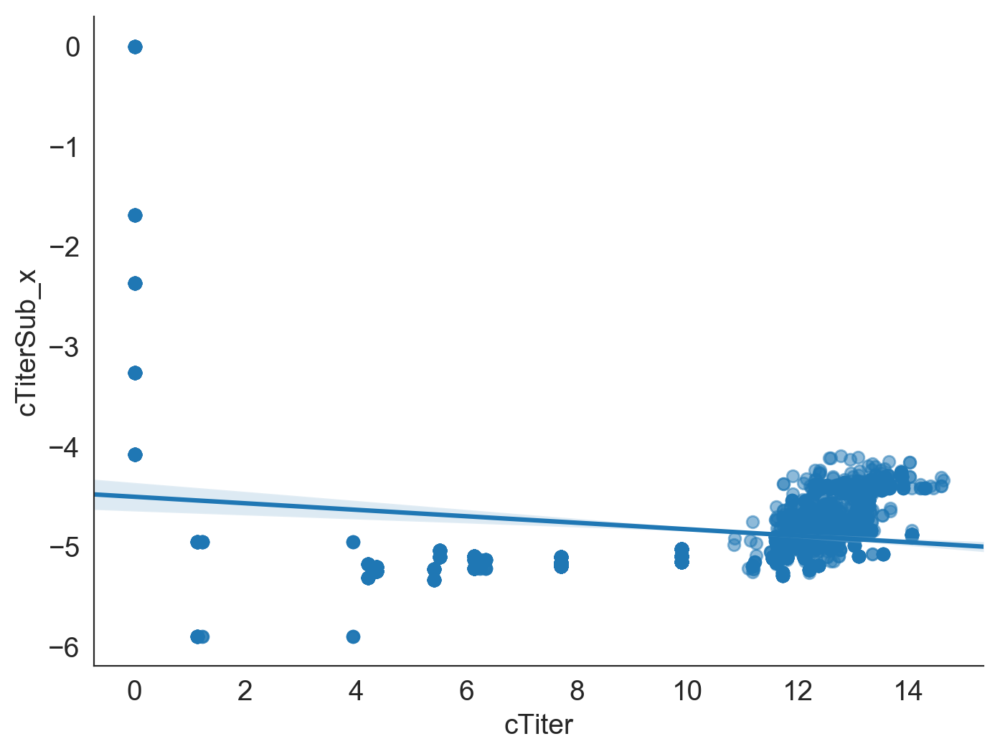

In [58]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("cTiter", "cTiterSub_x", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

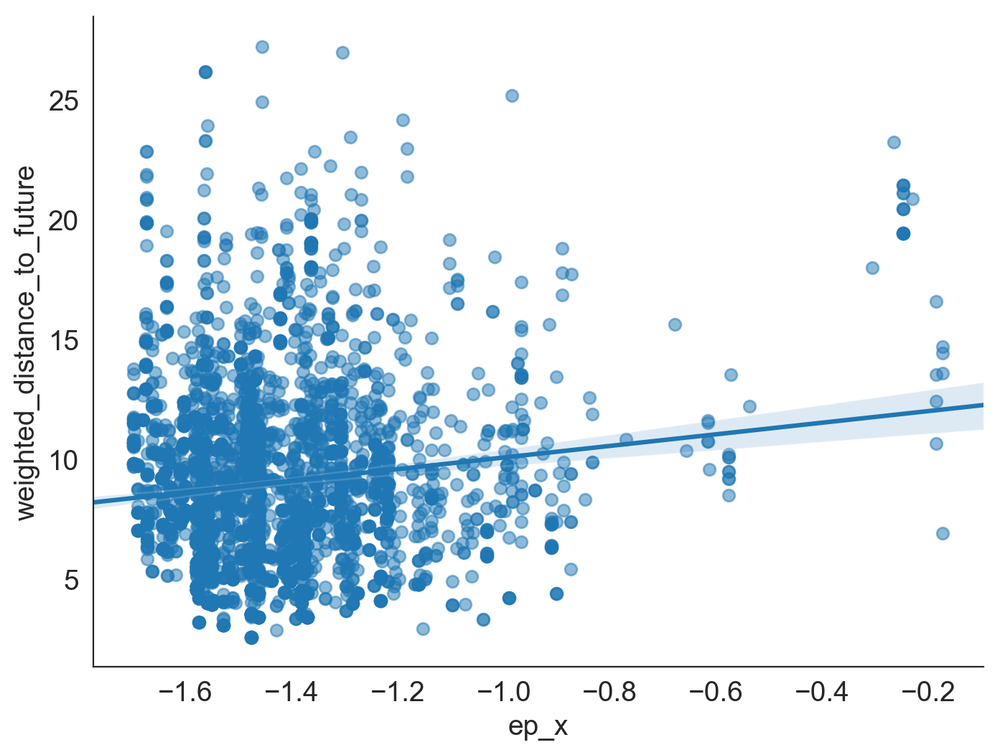

In [59]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("ep_x", "weighted_distance_to_future", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

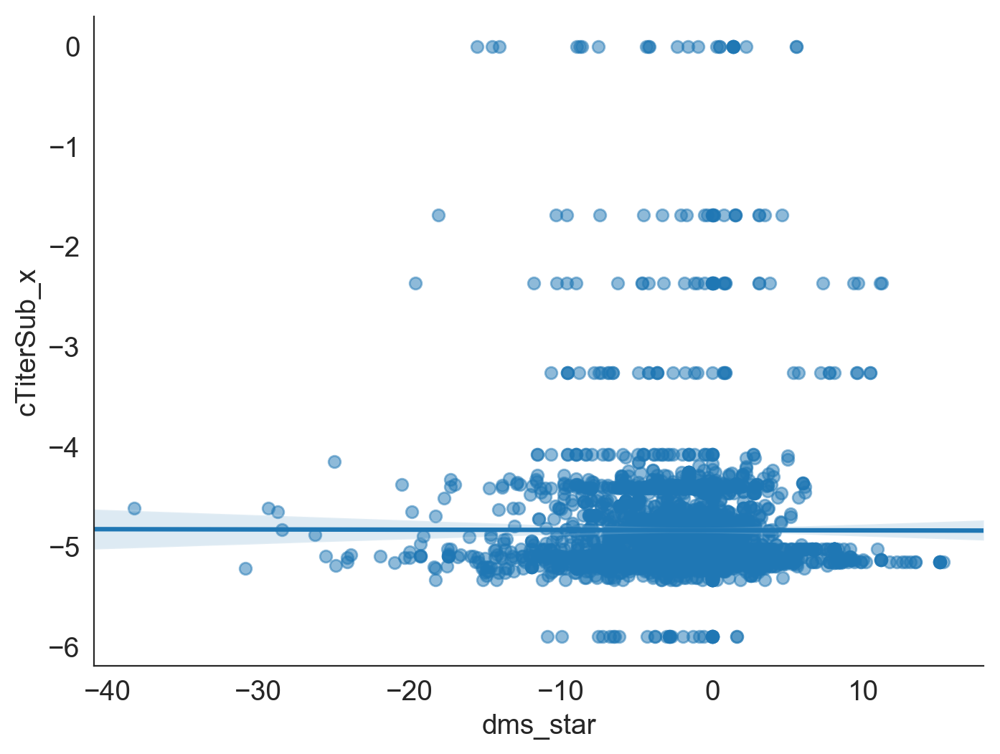

In [60]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("dms_star", "cTiterSub_x", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

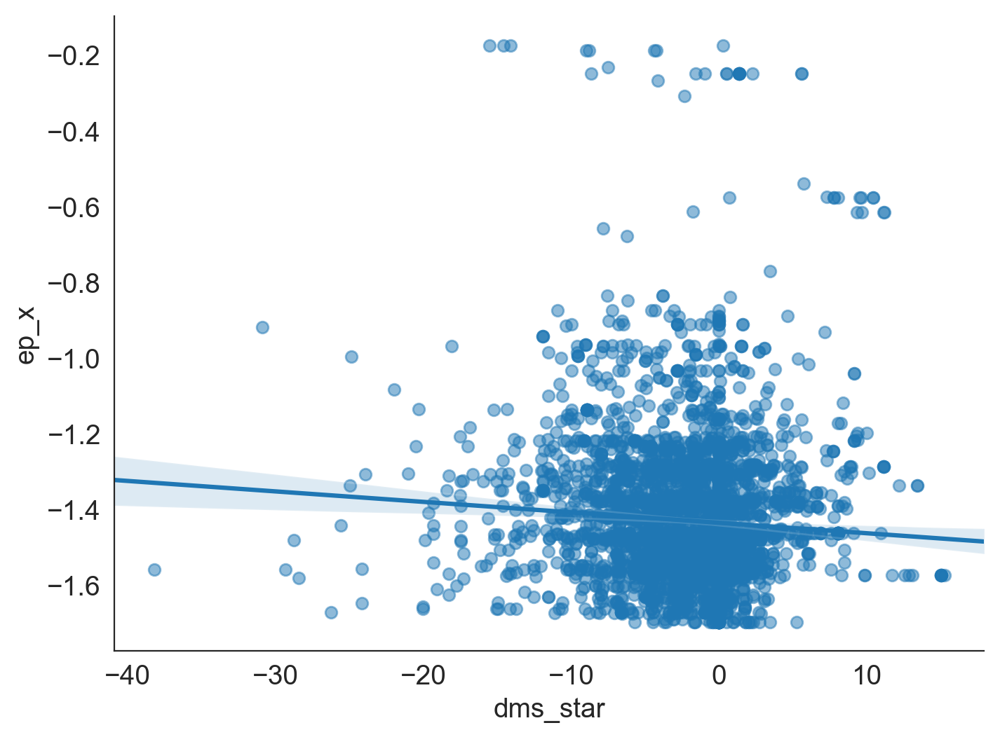

In [61]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("dms_star", "ep_x", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

In [62]:
tip_attributes_df.loc[tip_attributes_df["dms_star"] < -15, ["timepoint", "strain", "cTiterSub_x", "ep_x", "dms_star", "frequency", "raw_date"]].head()

,timepoint,strain,cTiterSub_x,ep_x,dms_star,frequency,raw_date
23,1995-10-01,A/Siena/3/1995,-0.000000,-0.173129,-15.53,0.003232,1995-01-27
43,1996-04-01,A/NewYork/636/1996,-1.681386,-0.967691,-18.10,0.055557,1996-01-22
76,1996-10-01,A/NewYork/636/1996,-2.362066,-1.408826,-19.63,0.000838,1996-01-22
379,2000-10-01,A/Queensland/4/2000,-5.199002,-1.466331,-15.18,0.055323,2000-09-05
383,2000-10-01,A/Waikato/4/2000,-5.199002,-1.348866,-18.41,0.059973,2000-08-28


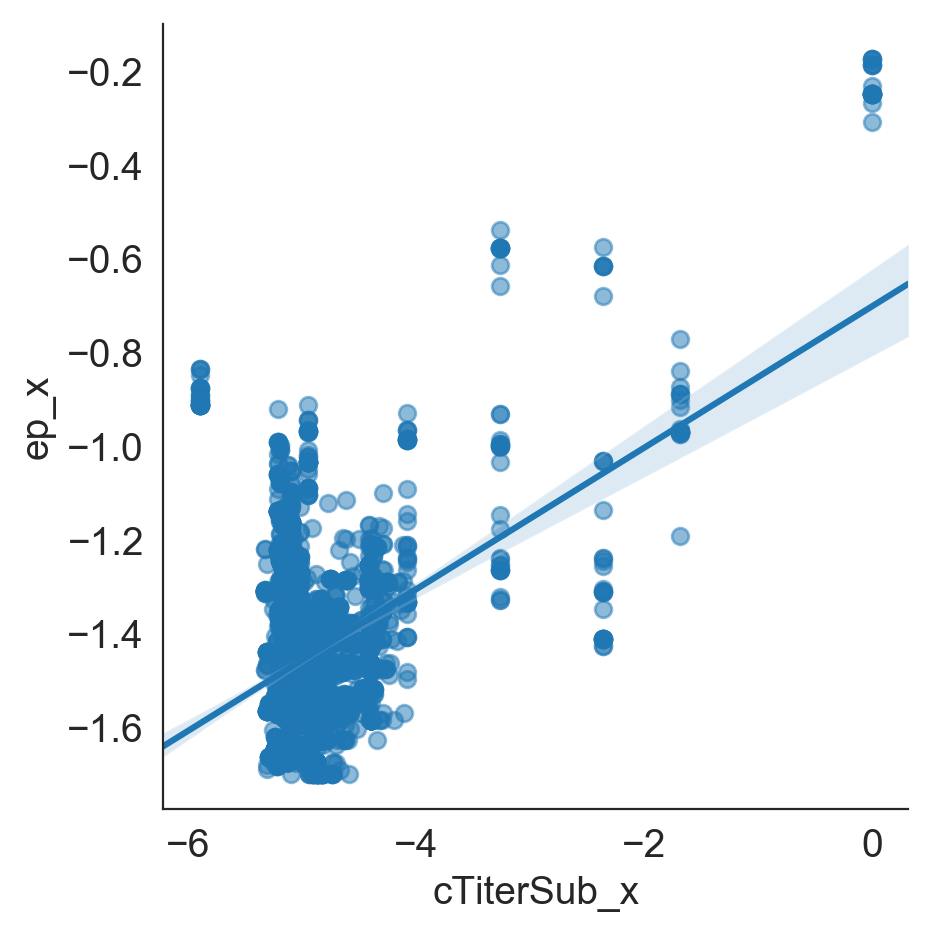

In [63]:
sns.lmplot("cTiterSub_x", "ep_x", tip_attributes_df, scatter_kws={"alpha": 0.5})

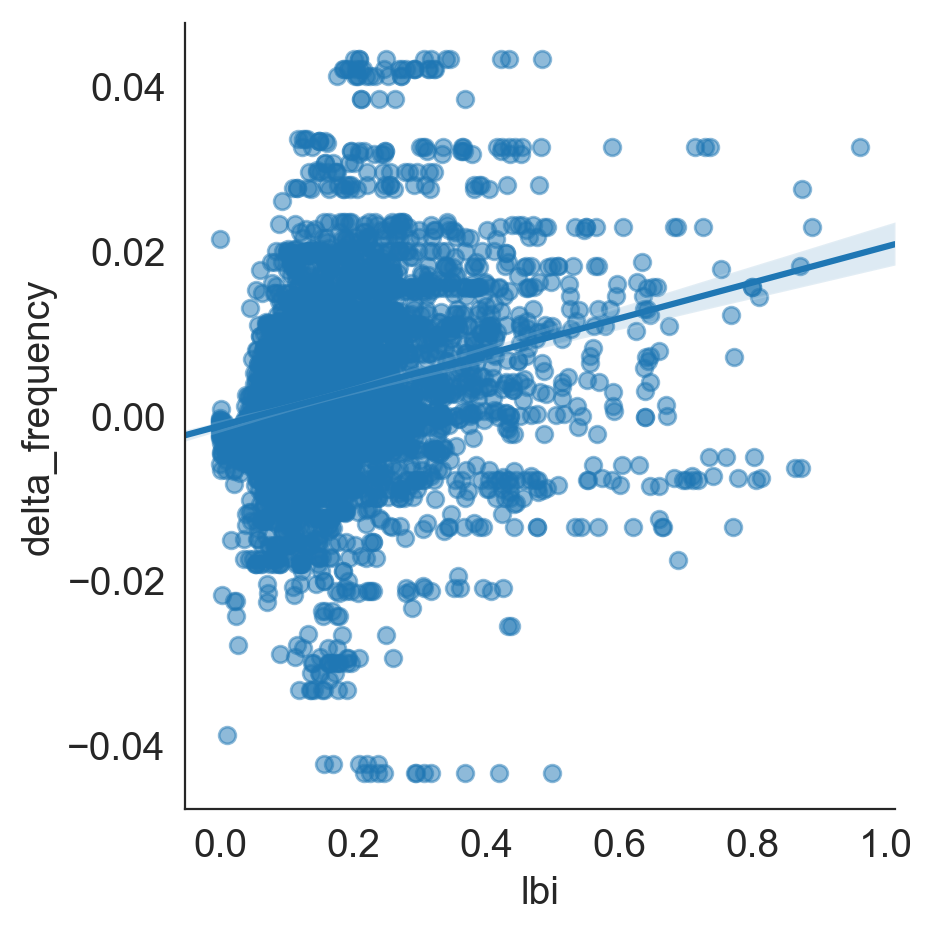

In [64]:
sns.lmplot("lbi", "delta_frequency", tip_attributes_df, scatter_kws={"alpha": 0.5})

## Summarize model residuals
[back to top](#Summarize-models)

In [65]:
residuals_by_timepoint = residual_df.groupby(["predictors", "timepoint"])["residual"].sum().reset_index()

In [66]:
residuals_by_timepoint.head()

,predictors,timepoint,residual
0,cTiter,1995-10-01,181.918125
1,cTiter,1996-04-01,344.389864
2,cTiter,1996-10-01,385.265991
3,cTiter,1997-04-01,178.589748
4,cTiter,1997-10-01,35.360790


In [67]:
residuals_by_timepoint.groupby("predictors")["residual"].sum()

predictors
cTiter               62867.298864
delta_frequency      71992.952371
dms_star             60194.849770
ep_x                 57657.634281
ep_x-ne_star         81916.067013
lbi                 102824.746282
lbi-ep_x-ne_star     99034.089966
naive                62087.213027
ne_star              86650.449088
Name: residual, dtype: float64

In [68]:
model_name = "lbi"

In [69]:
model_residuals_by_timepoint = residuals_by_timepoint[residuals_by_timepoint["predictors"] == model_name]

In [70]:
max_lags = 18

Text(0,0.5,'Number of clades')

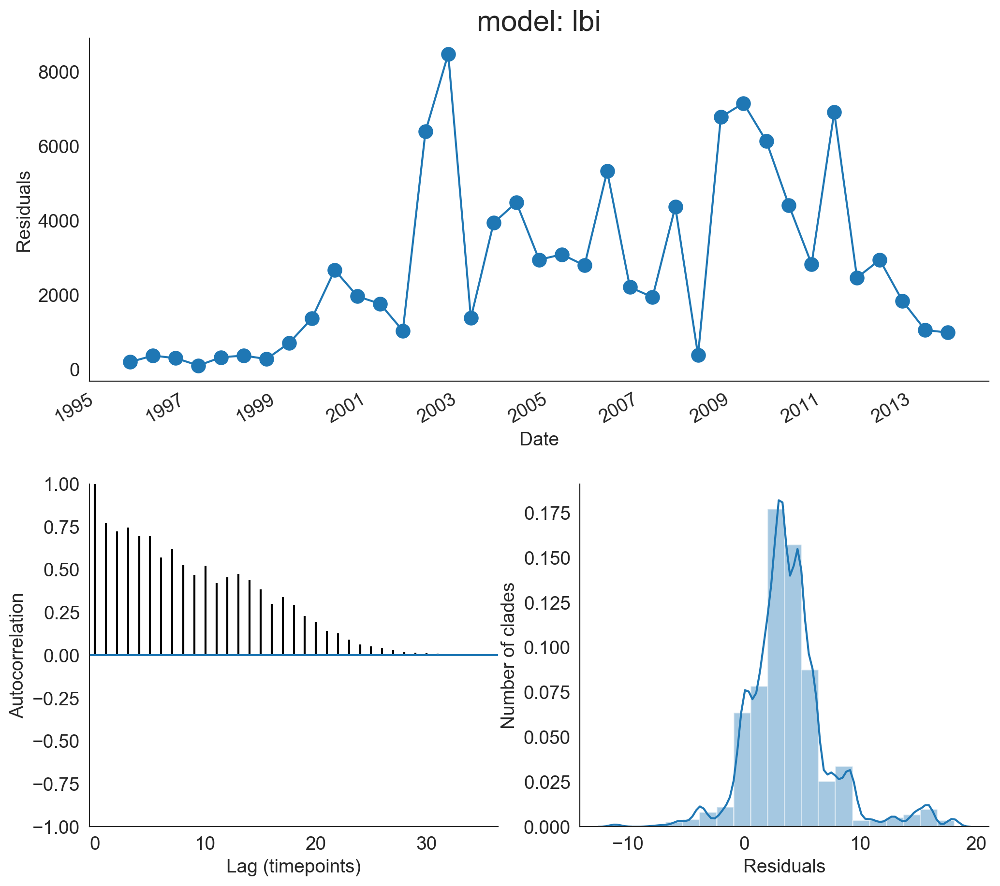

In [71]:
fig = plt.figure(figsize=(12, 12))
gs = gridspec.GridSpec(2, 2)
gs.update(hspace=0.3)

ax1 = plt.subplot(gs[0, :])
ax1.plot(model_residuals_by_timepoint["timepoint"], model_residuals_by_timepoint["residual"], "o-", markersize=10)
ax1.set_xlabel("Date")
ax1.set_ylabel("Residuals")
ax1.set_title("model: %s" % model_name)
plt.gcf().autofmt_xdate()

ax2 = plt.subplot(gs[1, :-1])
max_lags = len(model_residuals_by_timepoint["residual"]) - 1
lags, autocorrelation, lines, horizonal_lines = ax2.acorr(
    model_residuals_by_timepoint["residual"],
    maxlags=max_lags
)
ax2.set_xlabel("Lag (timepoints)")
ax2.set_ylabel("Autocorrelation")
ax2.set_xlim(-0.5, max_lags + 0.5)
ax2.set_ylim(-1, 1)

ax3 = plt.subplot(gs[1:, -1])
sns.distplot(residual_df.loc[residual_df["predictors"] == model_name, "residual"], ax=ax3, bins=20)
ax3.set_xlabel("Residuals")
ax3.set_ylabel("Number of clades")

### Residuals by predictor

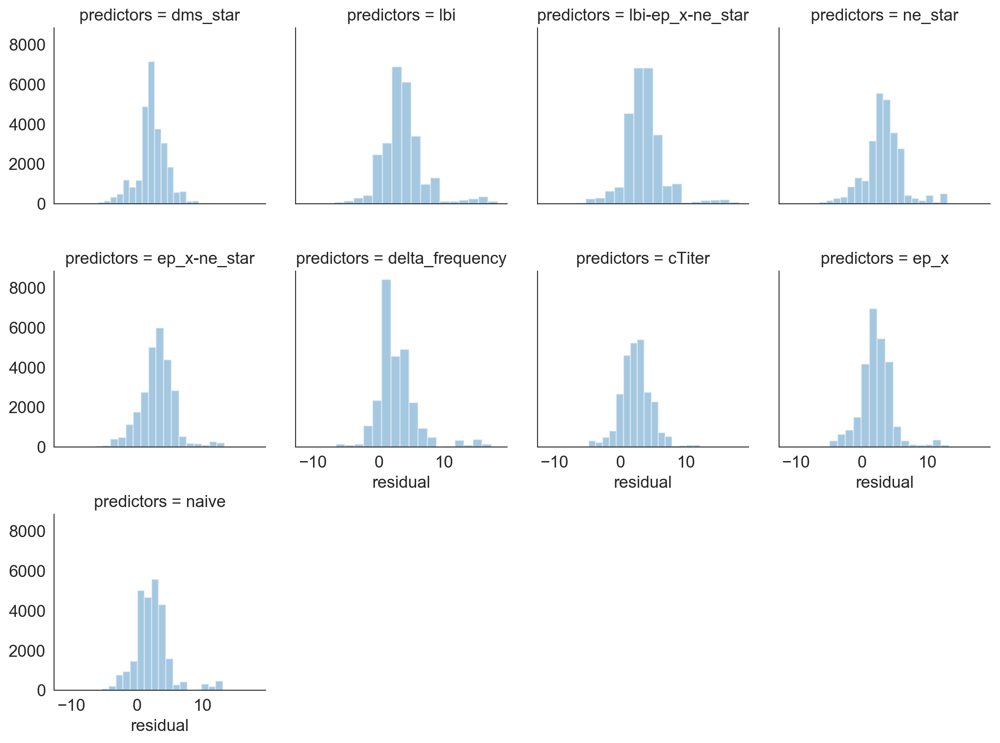

In [72]:
g = sns.FacetGrid(residual_df, col="predictors", col_wrap=4)
g.map(sns.distplot, "residual", bins=20, kde=False)

In [73]:
residual_df.groupby("predictors")["residual"].median().sort_values()

predictors
delta_frequency     1.912021
ep_x                2.035512
naive               2.185874
dms_star            2.211294
cTiter              2.325618
ep_x-ne_star        3.080030
ne_star             3.315134
lbi                 3.395391
lbi-ep_x-ne_star    3.446432
Name: residual, dtype: float64

In [74]:
residual_df.groupby("predictors")["residual"].count()

predictors
cTiter              26632
delta_frequency     26632
dms_star            26632
ep_x                26632
ep_x-ne_star        26632
lbi                 26632
lbi-ep_x-ne_star    26632
naive               26632
ne_star             26632
Name: residual, dtype: int64

In [75]:
(residual_df["residual"] < -0.01).sum()

26751

### Residuals by timepoint

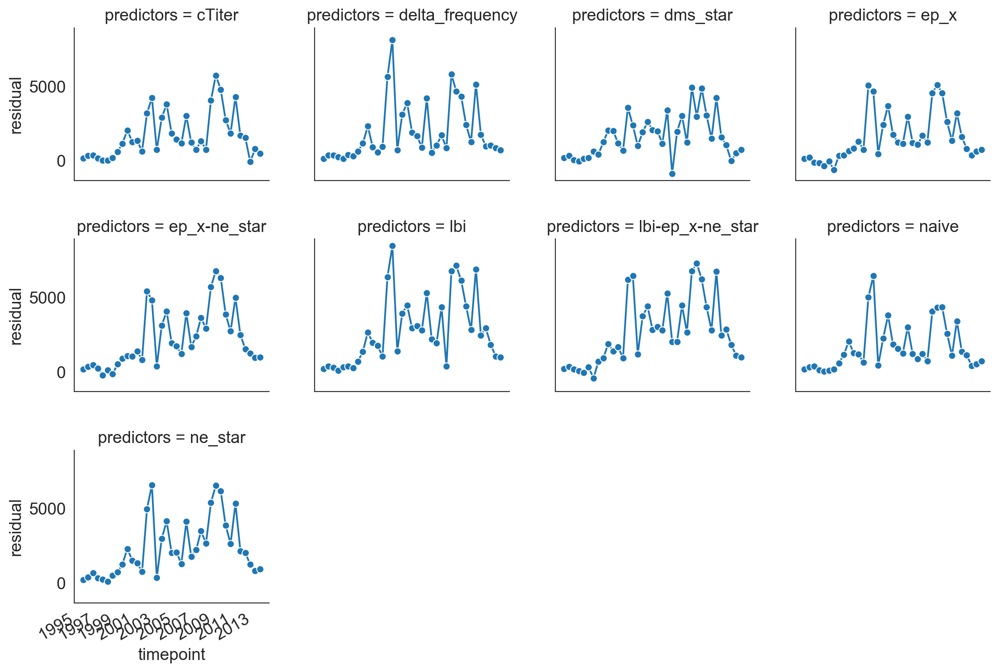

In [76]:
g = sns.FacetGrid(residuals_by_timepoint, col="predictors", col_wrap=4)
g.map(sns.lineplot, "timepoint", "residual", marker="o", linestyle="")
plt.gcf().autofmt_xdate()

In [77]:
np.abs(residuals_by_timepoint[residuals_by_timepoint["predictors"] == "lbi"]["residual"].values - residuals_by_timepoint[residuals_by_timepoint["predictors"] == "naive"]["residual"].values)

array([  23.60275362,   46.57840198,   68.59487162,   20.53700977,
        295.08947167,  289.94850538,   84.51955046,  118.55086707,
        219.1278171 ,  614.97808407,  694.04270814,  581.88518404,
        394.38767542, 1364.44150423, 2012.15815001,  951.51216739,
       1681.79038277,  678.75633851, 1095.28950174, 1520.89897378,
       1538.09333095, 2302.32373863,  986.36174669, 1053.76606109,
       3162.04696169,  347.62729217, 2712.42891244, 2817.99132269,
       1761.9385648 , 1826.83789859, 1723.58055641, 3488.24592902,
       1091.39143224, 1806.95693591, 1432.56420436,  533.60298173,
        268.60381454])

### Autocorrelation of residuals

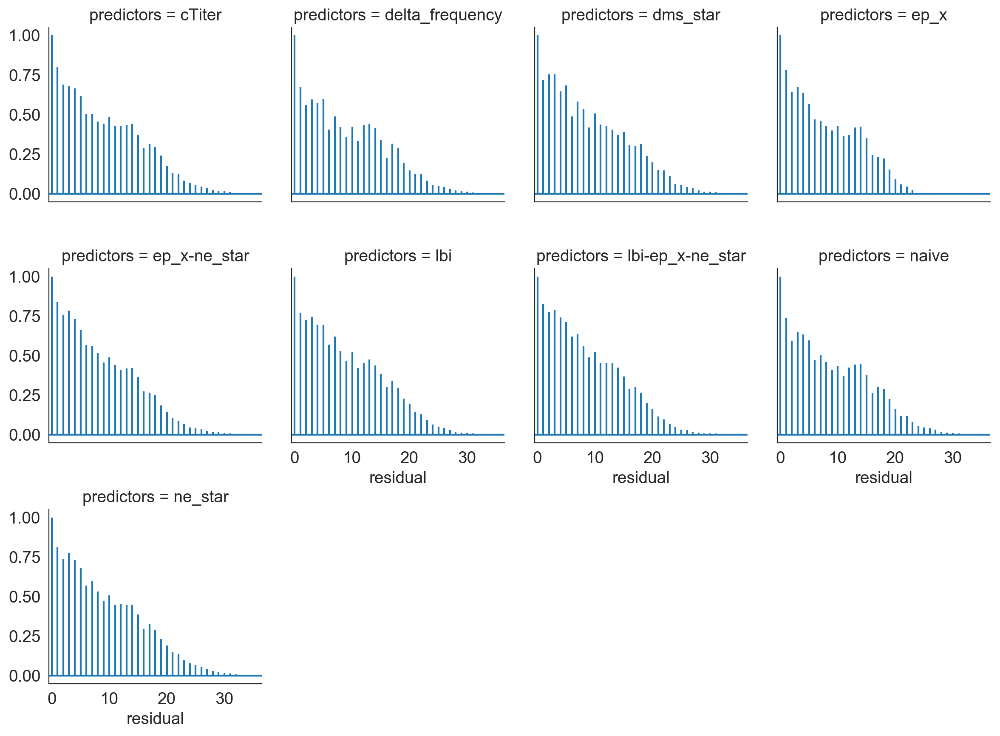

In [78]:
g = sns.FacetGrid(residuals_by_timepoint, col="predictors", col_wrap=4)
g.map(plt.acorr, "residual", maxlags=max_lags)

for ax in g.axes.flatten():
    ax.set_xlim(-0.5, max_lags + 0.5)

## Summarize observed and predicted distances
[back to top](#Summarize-models)

$$
d_{i}(x(t)) = \sum_{j}x_{j}d_{ij}
$$

$$
u = t + \Delta{t}
$$

$$
\hat{x}_{i}(t, u) = x_{i}(t)e^{(f_{i}(t)(u - t))}
$$

$$
y = x_{i}(t)d_{i}(x(u))
$$

$$
\hat{y} = x_{i}(t)d_{i}(\hat{x}(t, u))
$$

$$
D(x(t), x(u)) = \sum_{i}x_{i}d_{i}(u)
$$

$$
D(\hat{x}(t, u), x(u)) = \sum_{i}x_{i}e^{(f_{i}(t)(u - t))}d_{i}(u)
$$

$$
L = \sum_{t}D(\hat{x}(t, u), x(u))
$$

In [79]:
frequency_df[frequency_df["predictors"] == "lbi"].head()

,fitness,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
3480,-0.271622,0.034740,0.009575,A/Auckland/608/2002,2002-10-01,19.048754,6.852277,4.334772,19.048754,19.048754,14.713982,2002-10-01,lbi
3481,-0.444596,0.026914,0.006240,A/Auckland/611/2002,2002-10-01,19.056732,6.322624,2.679555,19.056732,19.056732,16.377177,2002-10-01,lbi
3482,0.383524,0.000195,0.000103,A/Auckland/614/2002,2002-10-01,19.930955,7.635063,5.282193,19.930955,19.930955,14.648762,2002-10-01,lbi
3483,0.124075,0.006197,0.002537,A/Auckland/615/2002,2002-10-01,19.928664,7.664781,5.300796,19.928664,19.928664,14.627868,2002-10-01,lbi
3484,3.003703,0.027860,0.203114,A/Canterbury/1/2002,2002-10-01,18.056737,5.376456,1.692034,18.056737,18.056737,16.364703,2002-10-01,lbi


In [80]:
frequency_df["observed_rank"] = frequency_df["y"] # / frequency_df["frequency"]
frequency_df["estimated_rank"] = frequency_df["y_hat"] # / frequency_df["frequency"]

In [81]:
data_to_plot = frequency_df[frequency_df["predictors"] == "lbi"]

In [82]:
minimum_observed_distance = data_to_plot.groupby("validation_timepoint")["observed_rank"].min().reset_index()

In [83]:
minimum_estimated_distance = data_to_plot.groupby("validation_timepoint")["estimated_rank"].min().reset_index()

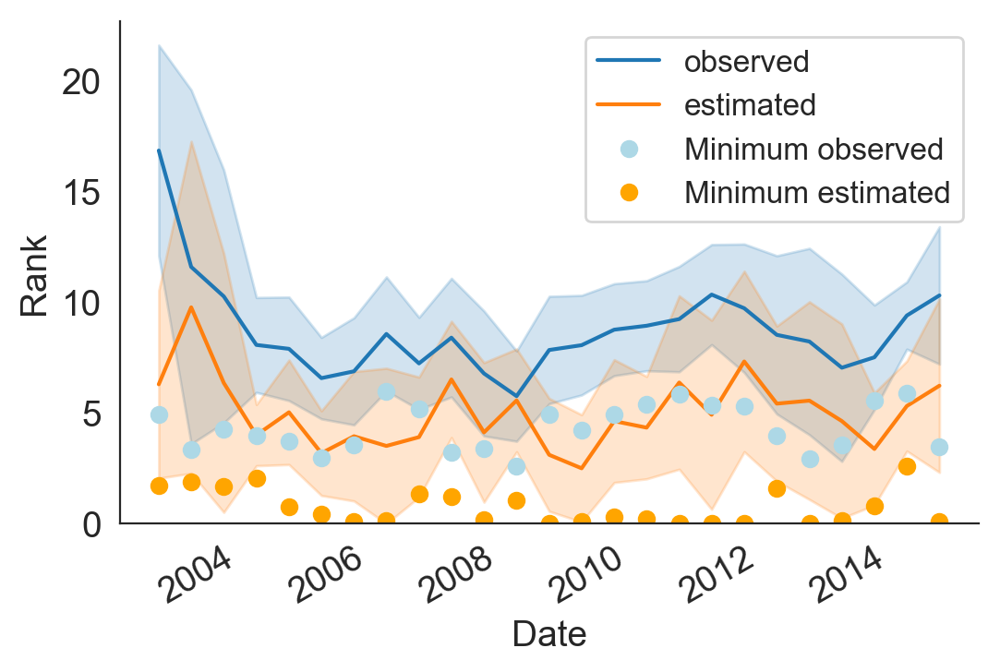

In [84]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax = sns.lineplot(
    "validation_timepoint",
    "observed_rank",
    data=data_to_plot,
    ci="sd",
    label="observed",
    ax=ax
)

ax = sns.lineplot(
    "validation_timepoint",
    "estimated_rank",
    data=data_to_plot,
    ci="sd",
    label="estimated",
    ax=ax
)

ax.plot(
    minimum_observed_distance["validation_timepoint"],
    minimum_observed_distance["observed_rank"],
    "o",
    color="lightblue",
    label="Minimum observed"
)

ax.plot(
    minimum_estimated_distance["validation_timepoint"],
    minimum_estimated_distance["estimated_rank"],
    "o",
    color="orange",
    label="Minimum estimated"
)

ax.legend()
ax.set_xlabel("Date")
ax.set_ylabel("Rank")
ax.set_ylim(bottom=0)
plt.gcf().autofmt_xdate()

In [85]:
vaccine_strains = [
    "A/Wisconsin/67/2005",
    "A/Brisbane/10/2007",
    "A/Perth/16/2009",
    "A/Victoria/361/2011",
    "A/Texas/50/2012",
    "A/Switzerland/9715293/2013",
    "A/HongKong/4801/2014"
]

In [86]:
vaccine_strain_data_to_plot = data_to_plot.loc[data_to_plot["strain"].isin(vaccine_strains),
                                               ["strain", "validation_timepoint", "observed_rank", "estimated_rank"]]

In [87]:
vaccine_strain_data_to_plot

,strain,validation_timepoint,observed_rank,estimated_rank
4767,A/Perth/16/2009,2009-10-01,7.993260,2.143027
5743,A/Victoria/361/2011,2012-04-01,6.366761,4.489059
5952,A/Texas/50/2012,2012-10-01,5.462374,2.995224
6520,A/HongKong/4801/2014,2014-04-01,5.872464,10.021466
6650,A/Switzerland/9715293/2013,2014-04-01,8.550162,2.571883
6769,A/HongKong/4801/2014,2014-10-01,3.444444,9.906084


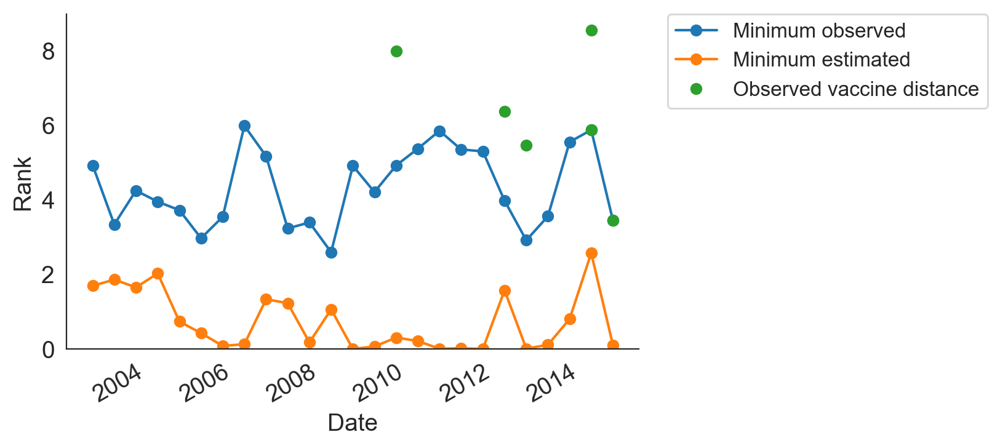

In [88]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax.plot(
    minimum_observed_distance["validation_timepoint"],
    minimum_observed_distance["observed_rank"],
    "o-",
    label="Minimum observed"
)

ax.plot(
    minimum_estimated_distance["validation_timepoint"],
    minimum_estimated_distance["estimated_rank"],
    "o-",
    label="Minimum estimated"
)

ax.plot(
    vaccine_strain_data_to_plot["validation_timepoint"],
    vaccine_strain_data_to_plot["observed_rank"],
    "o",
    label="Observed vaccine distance"
)

ax.set_xlabel("Date")
ax.set_ylabel("Rank")
ax.set_ylim(bottom=0)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.gcf().autofmt_xdate()

In [89]:
regressions = []
for predictors, group_df in frequency_df.groupby(["predictors"]):
    slope, intercept, r_value, p_value, std_err = linregress(
        group_df["y"],
        group_df["y_hat"]
    )
    
    regressions.append({
        "predictors": predictors,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "r_2": r_value ** 2,
        "p_value": p_value
    })

regressions = pd.DataFrame(regressions).sort_values(by="r_2", ascending=False)

In [90]:
regressions

,intercept,p_value,predictors,r_2,r_value,slope
1,-0.250606,0.000000e+00,delta_frequency,0.558898,0.747595,0.747849
7,1.637927,0.000000e+00,naive,0.521201,0.721942,0.560432
0,1.294909,0.000000e+00,cTiter,0.468684,0.684605,0.658039
2,1.554750,0.000000e+00,dms_star,0.466943,0.683332,0.568995
5,-1.020141,0.000000e+00,lbi,0.419087,0.647370,0.697750
6,-0.720937,0.000000e+00,lbi-ep_x-ne_star,0.414709,0.643979,0.691094
3,2.328397,0.000000e+00,ep_x,0.400163,0.632584,0.512328
8,1.495546,0.000000e+00,ne_star,0.366678,0.605539,0.485302
4,2.257412,1.841452e-246,ep_x-ne_star,0.276221,0.525567,0.437136


In [91]:
regressions_order = regressions["predictors"].values

In [92]:
regressions_order

array(['delta_frequency', 'naive', 'cTiter', 'dms_star', 'lbi',
       'lbi-ep_x-ne_star', 'ep_x', 'ne_star', 'ep_x-ne_star'],
      dtype=object)

In [93]:
final_frequency_df = frequency_df[frequency_df["predictors"].isin(best_models)].copy()

In [94]:
final_frequency_df["predictors_name"] = final_frequency_df["predictors"].map(dict(zip(best_models, best_predictor_names)))

In [95]:
final_frequency_df.head()

,fitness,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors,observed_rank,estimated_rank,predictors_name
0,-0.666988,0.034740,0.013621,A/Auckland/608/2002,2002-10-01,19.048754,6.852277,9.576228,19.048754,19.048754,9.472526,2002-10-01,dms_star,19.048754,9.576228,DMS phenotypes
1,-0.096415,0.026914,0.018671,A/Auckland/611/2002,2002-10-01,19.056732,6.322624,9.091628,19.056732,19.056732,9.965104,2002-10-01,dms_star,19.056732,9.091628,DMS phenotypes
2,-0.515448,0.000195,0.000089,A/Auckland/614/2002,2002-10-01,19.930955,7.635063,10.377529,19.930955,19.930955,9.553426,2002-10-01,dms_star,19.930955,10.377529,DMS phenotypes
3,-0.005720,0.006197,0.004707,A/Auckland/615/2002,2002-10-01,19.928664,7.664781,10.428715,19.928664,19.928664,9.499949,2002-10-01,dms_star,19.928664,10.428715,DMS phenotypes
4,0.244552,0.027860,0.027180,A/Canterbury/1/2002,2002-10-01,18.056737,5.376456,8.128970,18.056737,18.056737,9.927767,2002-10-01,dms_star,18.056737,8.128970,DMS phenotypes


In [96]:
"""max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(final_frequency_df, col="predictors_name", col_wrap=4, col_order=best_predictor_names)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")
g.set_axis_labels("Observed\ndistance to future", "Estimated\ndistance to future")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    slope, intercept, r_value, p_value = regressions.loc[
        regressions["predictors"] == facet_df["predictors"].unique()[0],
        ["slope", "intercept", "r_value", "p_value"]
    ].values[0]
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    if intercept < 0:
        intercept_operator = "-"
        intercept = -intercept
    else:
        intercept_operator = "+"
    
    ax.text(
        0.075,
        0.8,
        "y = %.2fx %s %.2f\n$r^2$ = %.2f%s" % (slope, intercept_operator, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.suptitle(
    "Model correlations compared to naive $r^2 = %.2f$" % regressions.loc[regressions["predictors"] == "naive", "r_2"].values[0],
    fontsize=12,
    y=1.0
)
plt.subplots_adjust(hspace=0.75, top=0.75, wspace=0.05)
plt.tight_layout()"""

'max_y = 30\nx = y = np.linspace(0, max_y, 10)\n\ng = sns.FacetGrid(final_frequency_df, col="predictors_name", col_wrap=4, col_order=best_predictor_names)\ng.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)\ng.set_titles("{col_name}")\ng.set_axis_labels("Observed\ndistance to future", "Estimated\ndistance to future")\n\nfor ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):\n    ax.plot(x, y, color="#cccccc", zorder=-10)\n    \n    slope, intercept, r_value, p_value = regressions.loc[\n        regressions["predictors"] == facet_df["predictors"].unique()[0],\n        ["slope", "intercept", "r_value", "p_value"]\n    ].values[0]\n    \n    if p_value > 0.001:\n        p_value = "\nP value = %.3f" % p_value\n    else:\n        p_value = ""\n    \n    if intercept < 0:\n        intercept_operator = "-"\n        intercept = -intercept\n    else:\n        intercept_operator = "+"\n    \n    ax.text(\n        0.075,\n        0.8,\n        "y = %.2fx %s %.2f\n$r^2$ 

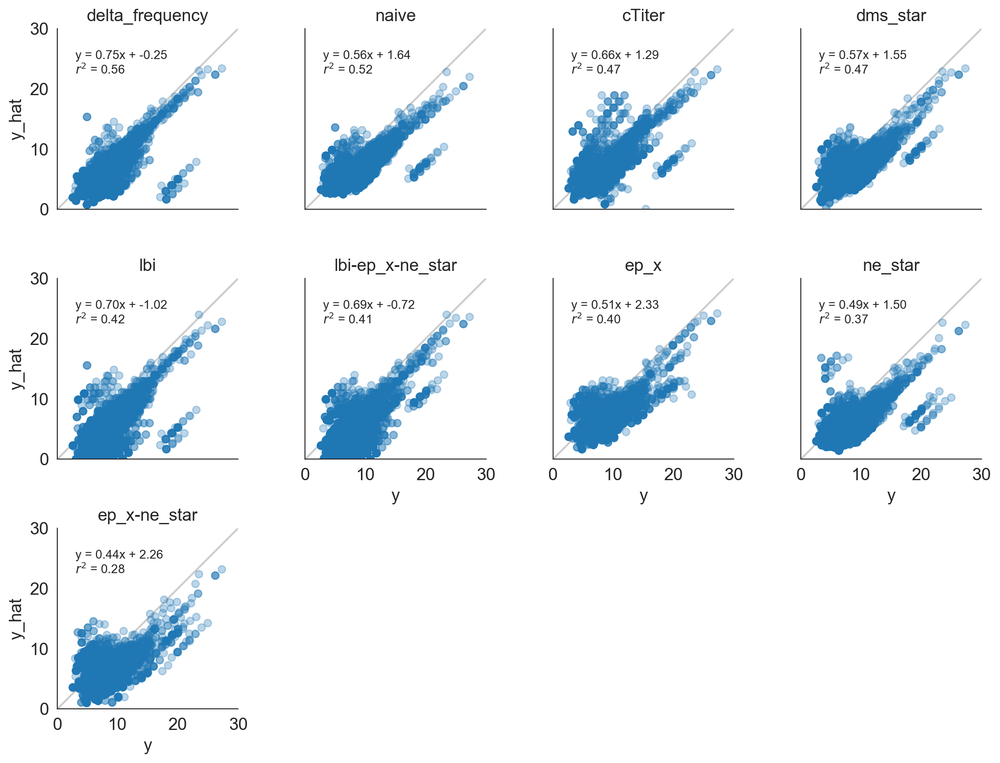

In [97]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df, col="predictors", col_wrap=4, col_order=regressions_order)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value = regressions.loc[
        regressions["predictors"] == facet_df["predictors"].unique()[0],
        ["slope", "intercept", "r_value", "p_value"]
    ].values[0]
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)

Text(0.35,0.75,'mean = 8.66')

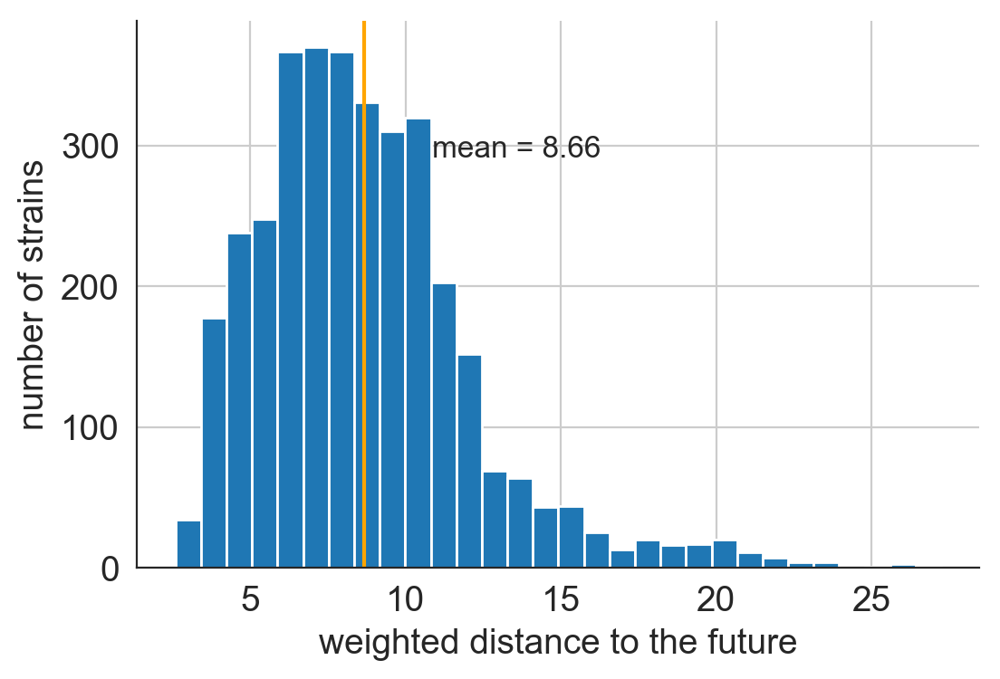

In [98]:
ax = frequency_df[frequency_df["predictors"] == "naive"]["y"].hist(bins=30)
ax.set_xlabel("weighted distance to the future")
ax.set_ylabel("number of strains")

mean_y = frequency_df[frequency_df["predictors"] == "naive"]["y"].mean()
ax.axvline(
    x=mean_y,
    color="orange"
)

ax.text(
    0.35,
    0.75,
    "mean = %.2f" % (mean_y,),
    transform=ax.transAxes,
    fontsize=12
)


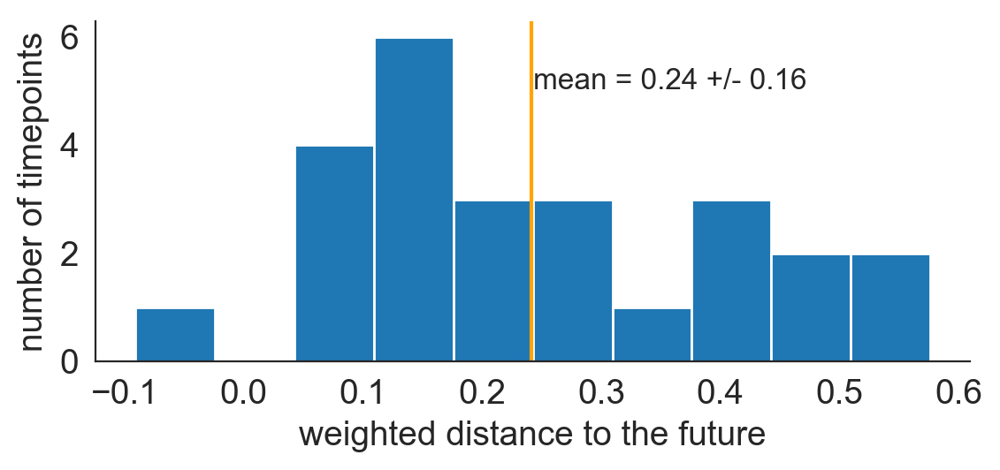

In [99]:
fig, ax = plt.subplots(1, 1, figsize=(6, 3))
ax.hist(errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"], bins=10)
ax.set_xlabel("weighted distance to the future")
ax.set_ylabel("number of timepoints")

mean_y = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].mean()
std_y = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].std()
ax.axvline(
    x=mean_y,
    color="orange"
)

ax.text(
    0.5,
    0.8,
    "mean = %.2f +/- %.2f" % (mean_y, std_y),
    transform=ax.transAxes,
    fontsize=12,
    horizontalalignment="left"
)

plt.tight_layout()
plt.savefig("../manuscript/figures/distance-of-natural-populations-between-timepoints.png")

In [100]:
best_models = [
    "naive",
    "lbi-dms_star-cTiterSub_x",
    "lbi-delta_frequency",
    "lbi",
    "lbi-ep_x-ne_star"
]

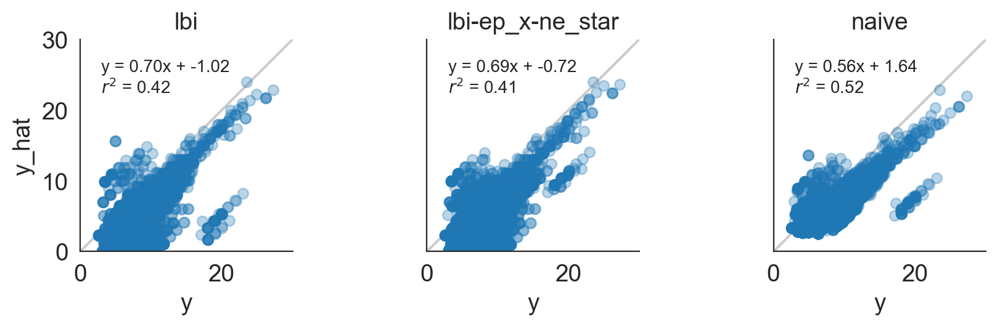

In [101]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df[frequency_df["predictors"].isin(best_models)], col="predictors", col_wrap=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)

In [102]:
frequency_df["year_month"] = frequency_df["validation_timepoint"].dt.strftime("%Y-%m")
frequency_df["year"] = frequency_df["validation_timepoint"].dt.strftime("%Y")

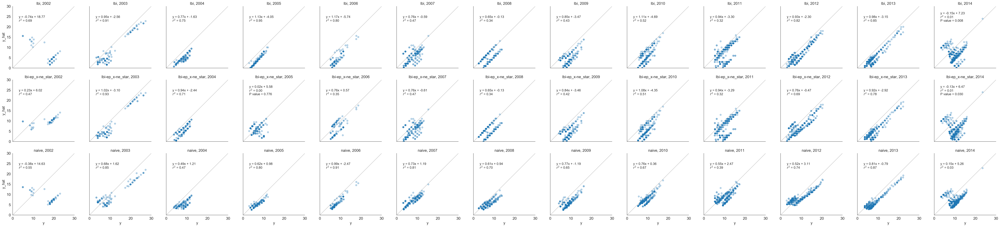

In [103]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df[frequency_df["predictors"].isin(best_models)], row="predictors", col="year", height=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{row_name}, {col_name}")

regressions_by_time = []
for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": facet_df["predictors"].unique()[0],
        "timepoint": facet_df["timepoint"].unique()[0],
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=12
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.tight_layout()

In [104]:
frequency_df.head()

,fitness,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors,observed_rank,estimated_rank,year_month,year
0,-0.666988,0.034740,0.013621,A/Auckland/608/2002,2002-10-01,19.048754,6.852277,9.576228,19.048754,19.048754,9.472526,2002-10-01,dms_star,19.048754,9.576228,2002-10,2002
1,-0.096415,0.026914,0.018671,A/Auckland/611/2002,2002-10-01,19.056732,6.322624,9.091628,19.056732,19.056732,9.965104,2002-10-01,dms_star,19.056732,9.091628,2002-10,2002
2,-0.515448,0.000195,0.000089,A/Auckland/614/2002,2002-10-01,19.930955,7.635063,10.377529,19.930955,19.930955,9.553426,2002-10-01,dms_star,19.930955,10.377529,2002-10,2002
3,-0.005720,0.006197,0.004707,A/Auckland/615/2002,2002-10-01,19.928664,7.664781,10.428715,19.928664,19.928664,9.499949,2002-10-01,dms_star,19.928664,10.428715,2002-10,2002
4,0.244552,0.027860,0.027180,A/Canterbury/1/2002,2002-10-01,18.056737,5.376456,8.128970,18.056737,18.056737,9.927767,2002-10-01,dms_star,18.056737,8.128970,2002-10,2002


In [105]:
regressions_by_time = []
for (predictors, timepoint), group_df in frequency_df.groupby(["predictors", "timepoint"]):
    slope, intercept, r_value, p_value, std_err = linregress(
        group_df["y"],
        group_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": predictors,
        "timepoint": timepoint,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })

regressions_by_time = pd.DataFrame(regressions_by_time)

In [106]:
regressions_by_time.head()

,intercept,p_value,predictors,r_value,slope,timepoint
0,13.288353,2.399450e-08,cTiter,-0.659628,-0.285931,2002-10-01
1,1.697735,5.753636e-47,cTiter,0.995147,0.758188,2003-04-01
2,-3.510787,8.973659e-36,cTiter,0.955927,0.978718,2003-10-01
3,2.036443,3.881549e-08,cTiter,0.565122,0.299559,2004-04-01
4,0.371517,1.067026e-39,cTiter,0.957986,0.702109,2004-10-01


In [107]:
naive_regressions_by_time = regressions_by_time[regressions_by_time["predictors"] == "naive"]
non_naive_regressions_by_time = regressions_by_time[regressions_by_time["predictors"] != "naive"]

In [108]:
"""
max_y = 25
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df, row="predictors", col="year_month", height=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{row_name}, {col_name}")

regressions_by_time = []
for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": facet_df["predictors"].unique()[0],
        "timepoint": facet_df["timepoint"].unique()[0],
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=12
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.tight_layout()"""

'\nmax_y = 25\nx = y = np.linspace(0, max_y, 10)\n\ng = sns.FacetGrid(frequency_df, row="predictors", col="year_month", height=4)\ng.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)\ng.set_titles("{row_name}, {col_name}")\n\nregressions_by_time = []\nfor ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):\n    slope, intercept, r_value, p_value, std_err = linregress(\n        facet_df["y"],\n        facet_df["y_hat"]\n    )\n    \n    regressions_by_time.append({\n        "predictors": facet_df["predictors"].unique()[0],\n        "timepoint": facet_df["timepoint"].unique()[0],\n        "slope": slope,\n        "intercept": intercept,\n        "r_value": r_value,\n        "p_value": p_value\n    })\n    \n    if p_value > 0.001:\n        p_value = "\nP value = %.3f" % p_value\n    else:\n        p_value = ""\n    \n    ax.plot(x, y, color="#cccccc", zorder=-10)\n    \n    ax.text(\n        0.1,\n        0.75,\n        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slop

## Summarize model forecasting error
[back to top](#Summarize-models)

### Earth mover's distances

Training and validation errors are reported as [earth mover's distances](https://en.wikipedia.org/wiki/Earth_mover%27s_distance). These values minimize the distance between observed and projected frequencies of tips at each timepoint with Hamming distance between amino acid sequences providing the ground distance between each pair of tips in respective timepoints.

In [109]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint
0,dms_star,0.368759,57,2002-10-01
1,dms_star,0.088138,47,2003-04-01
2,dms_star,0.318535,66,2003-10-01
3,dms_star,0.670658,81,2004-04-01
4,dms_star,0.027266,72,2004-10-01


In [110]:
distance_df = errors_by_time_df.groupby("predictors")["validation_error"].aggregate([
    "sum",
    "mean",
    "median"
]).sort_values(by="sum").reset_index()

In [111]:
distance_df

,predictors,sum,mean,median
0,lbi,0.463865,0.018555,-0.048821
1,lbi-ep_x-ne_star,2.131105,0.085244,-0.004977
2,delta_frequency,2.820159,0.112806,0.082773
3,dms_star,4.372805,0.174912,0.142184
4,ne_star,5.222371,0.208895,0.212516
5,naive,6.038976,0.241559,0.200011
6,ep_x-ne_star,6.316493,0.252660,0.232807
7,cTiter,6.710344,0.268414,0.229502
8,ep_x,7.125853,0.285034,0.248664


In [112]:
distance_df.loc[distance_df["predictors"] == "naive", "sum"].values[0]

6.038976051726375

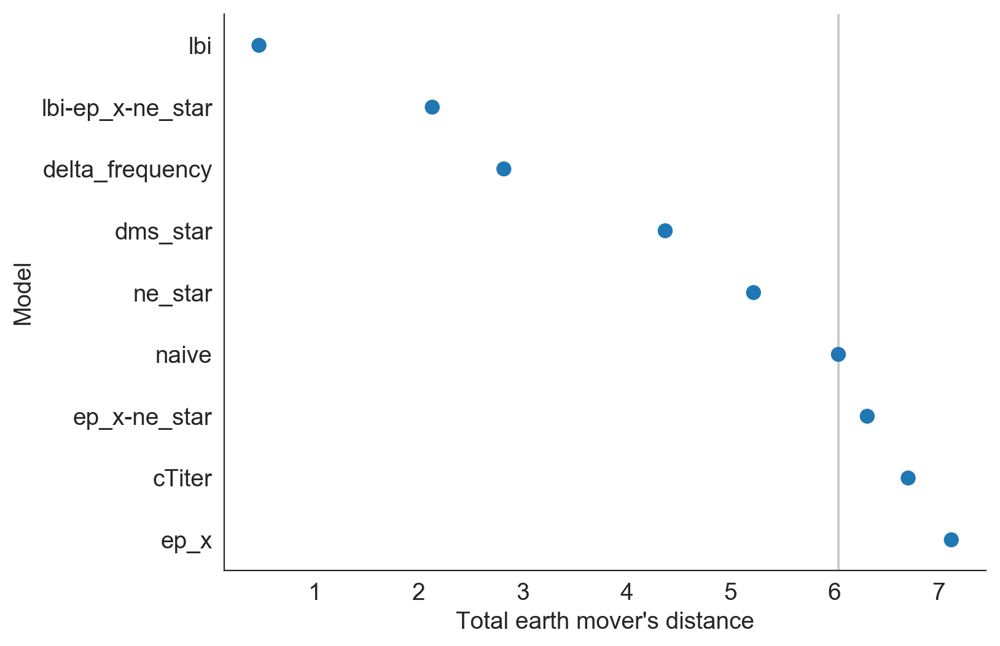

In [113]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="sum",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax
)

ax.set_xlabel("Total earth mover's distance")
ax.set_ylabel("Model")
ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "sum"].values[0],
    color="#cccccc",
    zorder=-10
)

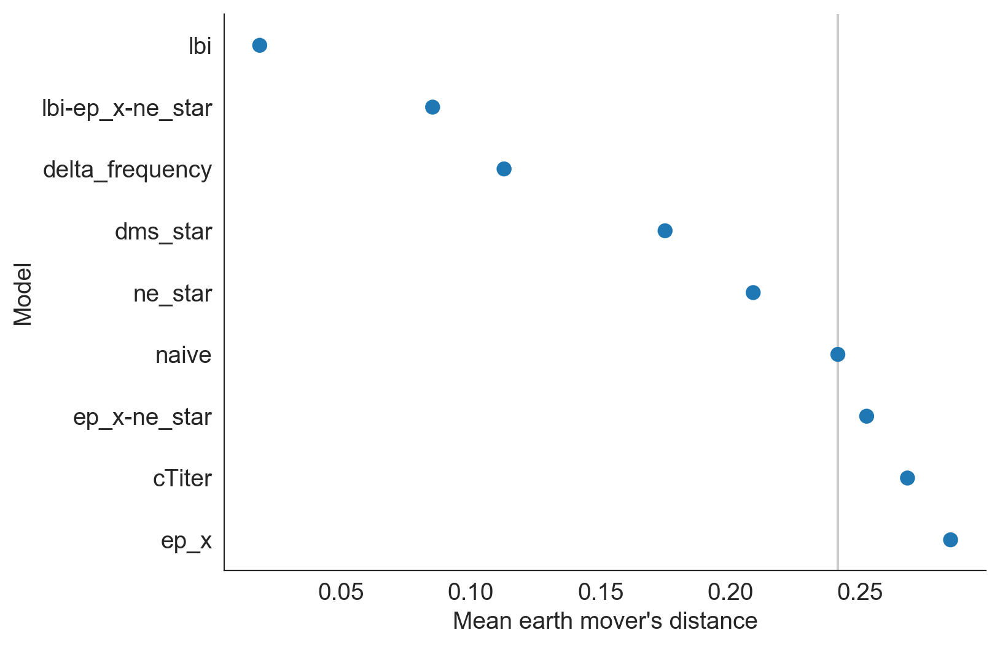

In [114]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="mean",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax
)

ax.set_xlabel("Mean earth mover's distance")
ax.set_ylabel("Model")

ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "mean"].values[0],
    color="#cccccc",
    zorder=-10
)

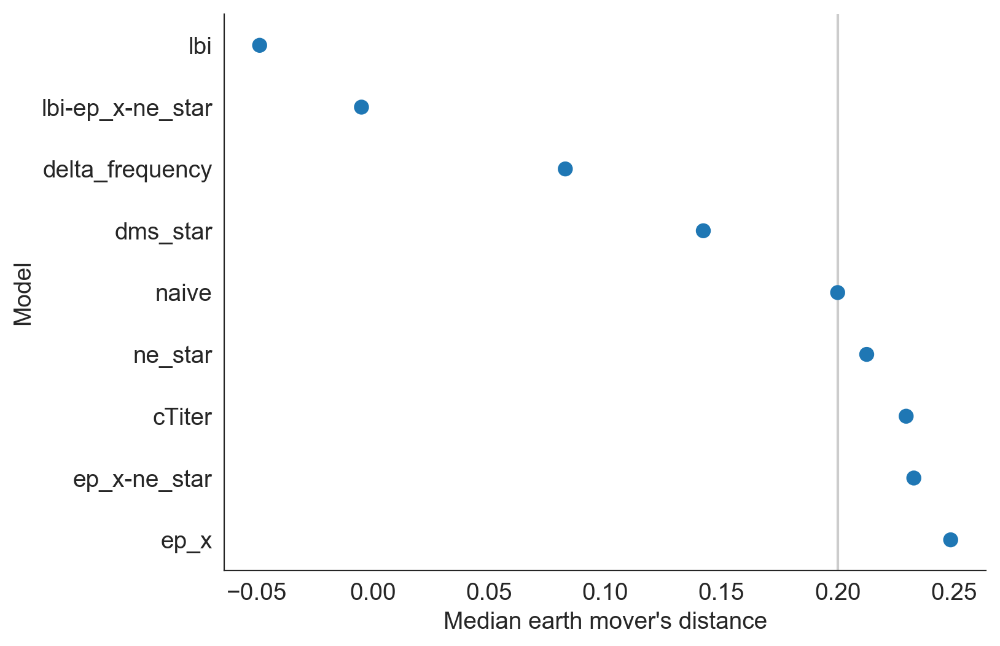

In [115]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="median",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax,
    order=distance_df.sort_values("median").loc[:, "predictors"]
)

ax.set_xlabel("Median earth mover's distance")
ax.set_ylabel("Model")

ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "median"].values[0],
    color="#cccccc",
    zorder=-10
)

In [116]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint
0,dms_star,0.368759,57,2002-10-01
1,dms_star,0.088138,47,2003-04-01
2,dms_star,0.318535,66,2003-10-01
3,dms_star,0.670658,81,2004-04-01
4,dms_star,0.027266,72,2004-10-01


In [117]:
predictor_type_order = [
    "naive",
    "ep",
    "cTiterSub",
    "ep_x",
    "cTiterSub_x",
    "ne_star",
    "dms_star",
    "lbi",
    "delta_frequency"
]

In [118]:
predictor_names = [
    "null",
    "epitope mutations",
    "HI phenotypes",
    "epitope cross-immunity",
    "HI cross-immunity",
    "non-epitope mutations",
    "DMS mutation effects",
    "LBI",
    "delta frequency"
]

In [119]:
"""
predictor_type_order = [
    "naive",
    "lbi"
]
predictor_names = predictor_type_order
"""

'\npredictor_type_order = [\n    "naive",\n    "lbi"\n]\npredictor_names = predictor_type_order\n'

In [120]:
predictor_name_by_id = dict(zip(predictor_type_order, predictor_names))

In [121]:
predictor_name_by_id

{'naive': 'null',
 'ep': 'epitope mutations',
 'cTiterSub': 'HI phenotypes',
 'ep_x': 'epitope cross-immunity',
 'cTiterSub_x': 'HI cross-immunity',
 'ne_star': 'non-epitope mutations',
 'dms_star': 'DMS mutation effects',
 'lbi': 'LBI',
 'delta_frequency': 'delta frequency'}

In [122]:
errors_by_time_df["predictors_name"] = errors_by_time_df["predictors"].map(predictor_name_by_id)

In [123]:
errors_by_time_df[errors_by_time_df["predictors"] == "naive"]

,predictors,validation_error,validation_n,validation_timepoint,predictors_name
200,naive,0.576160,57,2002-10-01,null
201,naive,0.514613,47,2003-04-01,null
202,naive,0.453460,66,2003-10-01,null
203,naive,0.378223,81,2004-04-01,null
204,naive,0.229502,72,2004-10-01,null
205,naive,0.159382,68,2005-04-01,null
206,naive,0.200011,73,2005-10-01,null
207,naive,0.083452,80,2006-04-01,null
208,naive,0.249152,49,2006-10-01,null
209,naive,0.387133,79,2007-04-01,null


In [124]:
predictor_type_order

['naive',
 'ep',
 'cTiterSub',
 'ep_x',
 'cTiterSub_x',
 'ne_star',
 'dms_star',
 'lbi',
 'delta_frequency']

In [125]:
individual_median_errors = []
for predictor in predictor_type_order:
    individual_median_errors.append(
        distance_df.loc[distance_df["predictors"] == predictor, "median"].values[0]
    )

IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
median_error = errors_by_time_df.groupby("predictors")["validation_error"].median().reset_index().sort_values(by="validation_error")
median_error_order = median_error["predictors"].values

In [ ]:
#median_error_order = [predictor for predictor in median_error_order if "-" not in predictor]

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

ax.plot(
    individual_median_errors,
    predictor_type_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax = sns.swarmplot(
    x="validation_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=predictor_type_order,
    color="#999999",
    zorder=-10
)

ax.set_yticklabels(predictor_names)

ax.set_xlabel("Earth mover's distance")
ax.set_ylabel("Model")
ax.set_xlim(left=0)

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(0, 22)

ax = sns.swarmplot(
    x="validation_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_error_order,
    color="#999999",
    zorder=-10
)

ax.plot(
    median_error["validation_error"],
    median_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax.set_xlabel("Earth mover's distance")
ax.set_ylabel("Model")

In [ ]:
errors_by_time_df.sort_values(by=["predictors", "validation_timepoint"], ascending=False).head()

In [ ]:
errors_by_time_df[errors_by_time_df["predictors"].str.contains("-")]["predictors"].unique()

In [ ]:
composite_predictors_order = [
    "lbi",
    "delta_frequency",
    "cTiterSub_x",
    "lbi-delta_frequency",
    "lbi-cTiterSub_x",
    "lbi-dms_star-cTiterSub_x",
    "lbi-ep_x-ne_star"
]

In [ ]:
composite_predictor_names = [
    "LBI",
    "delta frequency",
    "HI cross.",
    "LBI, delta frequency",
    "LBI, HI cross.",
    "LBI, DMS, HI cross.",
    "Luksza and Lassig"
]

In [ ]:
distance_df.head()

In [ ]:
"lbi" in distance_df["predictors"].values

In [ ]:
median_errors = []
for predictor in composite_predictors_order:
    if predictor in distance_df["predictors"].values:
        median_errors.append(distance_df.loc[distance_df["predictors"] == predictor, "median"].values[0])

In [ ]:
composite_predictors_order = [
    "lbi",
    "delta_frequency",
    "cTiterSub_x",
    "lbi-delta_frequency",
    "lbi-cTiterSub_x",
    "lbi-dms_star-cTiterSub_x",
    "lbi-ep_x-ne_star"
]

composite_predictor_names = [
    "LBI",
    "delta frequency",
    "HI phenotypes",
    "LBI, delta frequency",
    "LBI, HI phenotypes",
    "LBI, DMS, HI phenotypes",
    "Luksza and Lassig"
]

In [ ]:
median_errors

In [ ]:
"""
if len(median_errors) > 0:
    fig, ax = plt.subplots(1, 1, figsize=(8, 4))

    ax.set_xlim(0, 22)
    ax = sns.swarmplot(
        x="validation_error",
        y="predictors",
        data=errors_by_time_df,
        ax=ax,
        color="#999999",
        order=composite_predictors_order
    )

    ax.plot(
        median_errors,
        composite_predictors_order,
        marker="|",
        markersize=20,
        linestyle="",
        zorder=10
    )

    ax.set_yticklabels(composite_predictor_names)

    #labels = ax.get_yticklabels()
    #output = plt.setp(labels, rotation=30)

    ax.set_xlabel("Earth mover's distance")
    ax.set_ylabel("Model")
    ax.axvline(x=0.0, color="#cccccc", zorder=-20, alpha=0.25)

    plt.tight_layout()
"""

In [ ]:
errors_by_time_df.loc[pd.isnull(errors_by_time_df["predictors_name"]), "predictors_name"] = errors_by_time_df.loc[
    pd.isnull(errors_by_time_df["predictors_name"]), "predictors"
]

In [ ]:
g = facet_time_plot(
    errors_by_time_df,
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    col_wrap=2,
    markersize=7
)

In [ ]:
predictor_type_order

In [ ]:
antigenic_predictors = predictor_type_order[1:5]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(antigenic_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in antigenic_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)

In [ ]:
predictor_type_order

In [ ]:
functional_predictors = predictor_type_order[5:7]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(functional_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in functional_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)


In [ ]:
growth_predictors = predictor_type_order[7:]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(growth_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in growth_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)

In [ ]:
errors_by_time_df["predictors"].unique()

In [ ]:
errors_by_time_df[errors_by_time_df["predictors"] == "naive"]

In [ ]:
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"] == "naive"],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    height=6,
    aspect=1
)
#g.set_titles("{col_name}")
#g.fig.subplots_adjust(hspace=0.2)

In [ ]:
errors_by_time_df.head()

### Adjusted earth mover's distance (relative to naive model)

In [ ]:
naive_error = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].values
for predictor in errors_by_time_df["predictors"].drop_duplicates().values:
    #adjusted_error = ((errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "validation_error"] - naive_error) / naive_error) * 100
    adjusted_error = errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "validation_error"] - naive_error
    errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "adjusted_error"] = adjusted_error

In [ ]:
naive_error

In [ ]:
median_adjusted_error = errors_by_time_df.groupby("predictors")["adjusted_error"].median().reset_index().sort_values(by="adjusted_error")
median_adjusted_error_order = median_adjusted_error["predictors"].values

In [ ]:
errors_by_time_df["adjusted_error"].min()

In [ ]:
errors_by_time_df["adjusted_error"].max()

In [ ]:
median_adjusted_error_order

In [ ]:
errors_by_time_df["adjusted_error"].hist(bins=20)

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(-1, 2)

ax = sns.swarmplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10,
    size=3
)

ax.plot(
    median_adjusted_error["adjusted_error"],
    median_adjusted_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)


#ax.text(0.5, 0, "test")
for i, predictor in enumerate(median_adjusted_error_order):
    predictor_errors = errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "adjusted_error"]
    
    ax.text(
        -0.95,
        i,
        "%i%%" % (((predictor_errors < 0).sum() / float(predictor_errors.shape[0])) * 100),
        horizontalalignment='left',
        verticalalignment='center',
        fontsize=10
    )

ax.axvline(x=0, color="#cccccc", zorder=-10)

ax.set_xlabel("Relative earth mover's distance")
ax.set_ylabel("Model")

In [ ]:
errors_by_time_df.head()

In [ ]:
coefficients_by_time_df.head()

In [ ]:
errors_and_coefficients_by_time = coefficients_by_time_df.merge(
    errors_by_time_df,
    on=["predictors", "validation_timepoint"]
)

In [ ]:
sns.lmplot(
    "coefficient",
    "adjusted_error",
    errors_and_coefficients_by_time,
    col="predictors",
    col_wrap=2,
    sharex=False,
    sharey=False,
    col_order=["ep", "ep_star", "ep_x", "ep_luksza_x"]
)

In [ ]:
predictor_errors.shape[0]

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(-1, 2)

"""
ax = sns.swarmplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10
)
"""

ax = sns.boxenplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10
)

ax.plot(
    median_adjusted_error["adjusted_error"],
    median_adjusted_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax.axvline(x=0, color="#cccccc", zorder=-10)

ax.set_xlabel("Adjusted earth mover's distance")
ax.set_ylabel("Model")

In [ ]:
g = facet_time_plot(errors_by_time_df, "adjusted_error", "Relative earth mover's distance", timepoint_column="validation_timepoint",
                    col_wrap=2, markersize=7)
g.set_titles("{col_name}")

#for ax in g.axes.flatten():
#    ax.set_ylim(-5, 5)

In [ ]:
individual_predictor_names_order

In [ ]:
errors_by_time_df.head()

In [ ]:
errors_by_time_df["validation_timepoint_float"] = mdates.date2num(pd.to_datetime(errors_by_time_df["validation_timepoint"]))

In [ ]:
def facet_time_plot_with_labels(data, value, value_label, timepoint_column="timepoint", predictors_column="predictors", hue=None,
                    height=4, aspect=1, col_order=None, col_wrap=4, markersize=15, grid_kwargs=None):
    if grid_kwargs is None:
        grid_kwargs = {}
        
    g = sns.FacetGrid(data, col=predictors_column, col_order=col_order, col_wrap=col_wrap, hue=hue,
                      height=height, aspect=aspect, **grid_kwargs)
    g.map_dataframe(sns.lineplot, x=timepoint_column, y=value, estimator="mean", ci="sd", markers=True, dashes=False,
                   style=predictors_column, markersize=markersize)
    g.set_axis_labels("Date", value_label)

    for ax in g.axes.flatten():
        ax.axhline(y=0, color="#cccccc", zorder=-10)

        ax.xaxis.set_major_locator(mdates.YearLocator())
        #ax.xaxis.set_minor_locator(mdates.MonthLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

        #ax.fmt_xdata = mdates.DateFormatter('%Y')
        
        #start, end = [int(value) for value in ax.get_xlim()]
        #end = end + 1
        #stepsize = 2.0
        #ax.xaxis.set_ticks(np.arange(start, end, stepsize))

        #labels = ax.get_xticklabels()
        #output = plt.setp(labels, rotation=30)
        
    plt.gcf().autofmt_xdate(rotation=45)
    return g

In [ ]:
mpl.__version__

In [ ]:
best_models = [
    "ep_x",
    "ne_star",
    "lbi",
    "lbi-ep_x-ne_star",
    "cTiterSub_x",
    "dms_star",
    "delta_frequency",
    "lbi-cTiterSub_x-dms_star"
]

best_predictor_names = [
    "epitope mutations",
    "non-epitope mutations",
    "LBI",
    "LBI and mutations",
    "HI phenotypes",
    "DMS phenotypes",
    "delta frequency",
    "LBI, HI, and DMS"
]

In [ ]:
final_models_by_time_df = errors_by_time_df[errors_by_time_df["predictors"].isin(best_models)].copy()

In [ ]:
final_models_by_time_df["predictors_name"] = final_models_by_time_df["predictors"].map(dict(zip(best_models, best_predictor_names)))

In [ ]:
g = facet_time_plot_with_labels(
    final_models_by_time_df,
    "adjusted_error",
    "Relative earth mover's distance",
    predictors_column="predictors_name",
    timepoint_column="validation_timepoint_float",
    col_wrap=4,
    markersize=7,
    col_order=best_predictor_names
)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    #ax.set_ylim(-5, 5)
    
    proportion_better_than_naive = int(round(sum(facet_df["adjusted_error"] < 0) / float(facet_df.shape[0]) * 100))
    ax.text(
        0.9,
        0.85,
        "Median = %.2f\nBetter than naive %i%% of timepoints" % (facet_df["adjusted_error"].median(), proportion_better_than_naive),
        transform=ax.transAxes,
        fontsize=10,
        horizontalalignment='right'
    )

## Summarize model coefficients

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

ax.set_xlim(-20, 20)
sns.boxenplot(
    y="predictors",
    x="coefficient",
    hue="predictor",
    data=coefficients_by_time_df,
    width=2.0,
    ax=ax,
    order=predictor_names_order
)

ax.axvline(0, color="#999999", alpha=0.5, zorder=-10)
ax.set_xlabel("Beta coefficient")
ax.set_ylabel("Fitness metric")

sns.despine()

In [ ]:
overall_coefficients_df

In [ ]:
coefficients_by_time_df.head()

In [ ]:
final_coefficients_by_time = coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(best_models)].copy()

In [ ]:
final_coefficients_by_time["predictors_name"] = final_coefficients_by_time["predictors"].map(dict(zip(best_models, best_predictor_names)))

In [ ]:
final_coefficients_by_time["validation_timepoint_float"] = mdates.date2num(pd.to_datetime(final_coefficients_by_time["validation_timepoint"]))

In [ ]:
final_coefficients_by_time.head()

In [ ]:
coefficients_by_time_df["predictors_name"] = coefficients_by_time_df["predictors"].map(predictor_name_by_id)

In [ ]:
coefficients_by_time_df.loc[pd.isnull(coefficients_by_time_df["predictors_name"]), "predictors_name"] = coefficients_by_time_df.loc[
    pd.isnull(coefficients_by_time_df["predictors_name"]), "predictors"
]

In [ ]:
coefficients_by_time_df["predictors_name"].unique().shape

In [ ]:
g = facet_time_plot_with_labels(
    final_coefficients_by_time,
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint_float",
    predictors_column="predictors_name",
    hue="predictor",
    col_order=best_predictor_names,
    col_wrap=4,
    markersize=7
)
g.set_titles("{col_name}")
g.add_legend()

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    ax.set_ylim(-5, 5)

In [ ]:
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"] != "naive"],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    hue="predictor",
    markersize=7
)
g.set_titles("{col_name}")

for ax in g.axes.flatten():
    ax.set_ylim(-11, 11)

In [ ]:
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"] != "naive"],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_order=[predictor_name_by_id[predictor] for predictor in predictor_type_order[1:]],
    hue="predictor",
    markersize=7
)
g.set_titles("{col_name}")

for ax in g.axes.flatten():
    ax.set_ylim(-11, 11)

In [ ]:
composite_predictors_order

In [ ]:
lbi_dfreq_order = ["lbi", "delta_frequency", "lbi-delta_frequency"]
lbi_dfreq_names = ["LBI", "delta frequency", "LBI, delta frequency"]
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(lbi_dfreq_order)],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    hue="predictor",
    col_order=lbi_dfreq_order,
    markersize=7
)

#g.set_titles("{col_name}")

for ci, ax in enumerate(g.axes.flatten()):
    ax.set_title(lbi_dfreq_names[ci], fontsize=12)
    #ax.set_ylim(-2., 2.)

In [ ]:
lbi_dfreq_order = ["lbi", "cTiterSub_x", "lbi-cTiterSub_x"]
lbi_dfreq_names = ["LBI", "HI cross-immunity", "LBI, HI cross-immunity"]
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(lbi_dfreq_order)],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    hue="predictor",
    col_order=lbi_dfreq_order,
    markersize=7
)

#g.set_titles("{col_name}")

for ci, ax in enumerate(g.axes.flatten()):
    ax.set_title(lbi_dfreq_names[ci], fontsize=12)
    #ax.set_ylim(-2., 2.)

## Figure 3: Summary of models for natural populations

In [ ]:
colors = ['#d73027','#fc8d59','#fee090','#e0f3f8','#91bfdb','#4575b4']

In [ ]:
colors.reverse()

In [ ]:
colors

In [ ]:
dict(zip(individual_predictor_names_order, colors))

In [ ]:
nrows = len(individual_predictor_names_order)
ncols = 2
color_by_predictor = {
    'ep': '#4575b4',
    'ep_star': '#4575b4',
    'ep_x': '#4575b4',
    'cTiter': '#91bfdb',
    'cTiterSub': '#91bfdb',
    'cTiterSub_star': '#91bfdb',
    'cTiterSub_x': '#91bfdb',
    'ne_star': '#999999',
    'dms_star': '#fee090',
    'lbi': '#fc8d59',
    'delta_frequency': '#d73027'
}

name_by_predictor = {
    "ep": "epitope mutations",
    "ep_star": "epitope ancestor",
    "ep_x": "cross-immunity",
    "cTiter": "linear HI tree phenotypes",
    "cTiterSub": "linear HI mutation phenotypes",
    "cTiterSub_star": "ancestral HI mutation phenotypes",
    "cTiterSub_x": "HI phenotypes",
    "ne_star": "non-epitope mutations",
    "dms_star": "DMS phenotypes",
    "lbi": "LBI",
    "delta_frequency": "delta frequency"
}

In [ ]:
errors_by_time_df.head()

In [ ]:
min_error = errors_by_time_df["adjusted_error"].min()
max_error = errors_by_time_df["adjusted_error"].max()

min_normal_error = errors_by_time_df["validation_error"].min()
max_normal_error = errors_by_time_df["validation_error"].max()

min_coefficient = coefficients_by_time_df["coefficient"].min()
max_coefficient = coefficients_by_time_df["coefficient"].max()

min_date = errors_by_time_df["validation_timepoint"].min() - pd.DateOffset(months=6)
max_date = errors_by_time_df["validation_timepoint"].max() + pd.DateOffset(months=6)

In [ ]:
individual_predictor_names_order

In [ ]:
individual_predictor_names_order = [
    'ep_x',
    "cTiter",
    'ne_star',
    'dms_star',
    'delta_frequency',
    'lbi'
]

In [ ]:
nrows = len(individual_predictor_names_order)

In [ ]:
fig, axes = plt.subplots(figsize=(12, 12), facecolor='w')
gs = gridspec.GridSpec(
    nrows=nrows,
    ncols=ncols,
    hspace=0.05,
    wspace=0.2
)

years = mdates.YearLocator()
years_fmt = mdates.DateFormatter('%Y')
months = mdates.MonthLocator()

for i, predictor in enumerate(individual_predictor_names_order):
    error_df = errors_by_time_df[errors_by_time_df["predictors"] == predictor].copy()
    coefficient_df = coefficients_by_time_df[coefficients_by_time_df["predictors"] == predictor].copy()

    distance_ax = plt.subplot(gs[i, 0])    
    distance_ax.set_xlabel("Date")
    distance_ax.set_ylabel("Adjusted\ndistance\nto future")
    distance_ax.set_ylim(-0.75, 0.75)
    distance_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f aa" % (name_by_predictor[predictor], error_df["adjusted_error"].mean(), error_df["adjusted_error"].std()),
        fontdict={"fontsize": 12},
        transform=distance_ax.transAxes
    )
    
    distance_ax.axhline(
        y=0.0,
        color="#cccccc"
    )
    
    distance_ax.plot(
        pd.to_datetime(error_df["validation_timepoint"]).astype(np.datetime64),
        error_df["adjusted_error"],
        "o-",
        color="#000000"
    )
    
    distance_ax.set_xlim(min_date, max_date)
    distance_ax.xaxis.set_major_locator(years)
    distance_ax.xaxis.set_major_formatter(years_fmt)
    distance_ax.xaxis.set_minor_locator(months)
    distance_ax.format_xdata = mdates.DateFormatter('%Y-%m')
        
    coefficient_ax = plt.subplot(gs[i, 1])
    coefficient_ax.set_xlabel("Date")
    coefficient_ax.set_ylabel("Coefficient")
    coefficient_ax.set_ylim(min_coefficient - 1, max_coefficient + 1)

    coefficient_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f" % (name_by_predictor[predictor], coefficient_df["coefficient"].mean(), coefficient_df["coefficient"].std()),
        fontdict={"fontsize": 12},
        transform=coefficient_ax.transAxes
    )
    
    coefficient_ax.axhline(
        y=0.0,
        color="#cccccc"
    )

    coefficient_ax.plot(
        coefficient_df["validation_timepoint"],
        coefficient_df["coefficient"],
        "o-",
        color=color_by_predictor[predictor]
    )
    
    coefficient_ax.set_xlim(min_date, max_date)
    coefficient_ax.xaxis.set_major_locator(years)
    coefficient_ax.xaxis.set_major_formatter(years_fmt)
    coefficient_ax.xaxis.set_minor_locator(months)
    coefficient_ax.format_xdata = mdates.DateFormatter('%Y-%m')
    
fig.autofmt_xdate()

gs.tight_layout(fig)
plt.savefig("../manuscript/figures/model-accuracy-and-coefficients-for-natural-populations.png")

# show x-axis tick lines

In [ ]:
nrows

In [ ]:
individual_predictor_names_order

In [ ]:
fig, axes = plt.subplots(figsize=(12, 12), facecolor='w')
gs = gridspec.GridSpec(
    nrows=nrows,
    ncols=ncols,
    hspace=0.1,
    wspace=0.2
)

years = mdates.YearLocator()
years_fmt = mdates.DateFormatter('%Y')
months = mdates.MonthLocator()

naive_error_df = errors_by_time_df[errors_by_time_df["predictors"] == "naive"].copy()

for i, predictor in enumerate(individual_predictor_names_order):
    error_df = errors_by_time_df[errors_by_time_df["predictors"] == predictor].copy()
    coefficient_df = coefficients_by_time_df[coefficients_by_time_df["predictors"] == predictor].copy()

    distance_ax = plt.subplot(gs[i, 0])    
    distance_ax.set_xlabel("Date")
    distance_ax.set_ylabel("Distance\nto future")
    distance_ax.set_ylim(-0.5, 0.8)
    distance_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f" % (name_by_predictor[predictor], error_df["validation_error"].mean(), error_df["validation_error"].std()),
        fontdict={"fontsize": 12},
        transform=distance_ax.transAxes
    )
    
    distance_ax.axhline(
        y=0.0,
        color="#cccccc"
    )
    
    distance_ax.plot(
        pd.to_datetime(naive_error_df["validation_timepoint"]).astype(np.datetime64),
        naive_error_df["validation_error"],
        "o-",
        color="#cccccc",
        zorder=-10
    )
    
    distance_ax.plot(
        pd.to_datetime(error_df["validation_timepoint"]).astype(np.datetime64),
        error_df["validation_error"],
        "o-",
        color="#000000"
    )
    
    distance_ax.set_xlim(min_date, max_date)
    distance_ax.xaxis.set_major_locator(years)
    distance_ax.xaxis.set_major_formatter(years_fmt)
    distance_ax.xaxis.set_minor_locator(months)
    distance_ax.format_xdata = mdates.DateFormatter('%Y-%m')
        
    coefficient_ax = plt.subplot(gs[i, 1])
    coefficient_ax.set_xlabel("Date")
    coefficient_ax.set_ylabel("Coefficient")
    coefficient_ax.set_ylim(min_coefficient - 1, max_coefficient + 1)

    coefficient_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f" % (name_by_predictor[predictor], coefficient_df["coefficient"].mean(), coefficient_df["coefficient"].std()),
        fontdict={"fontsize": 12},
        transform=coefficient_ax.transAxes
    )
    
    coefficient_ax.axhline(
        y=0.0,
        color="#cccccc"
    )

    coefficient_ax.plot(
        coefficient_df["validation_timepoint"],
        coefficient_df["coefficient"],
        "o-",
        color=color_by_predictor[predictor]
    )
    
    coefficient_ax.set_xlim(min_date, max_date)
    coefficient_ax.xaxis.set_major_locator(years)
    coefficient_ax.xaxis.set_major_formatter(years_fmt)
    coefficient_ax.xaxis.set_minor_locator(months)
    coefficient_ax.format_xdata = mdates.DateFormatter('%Y-%m')
    
fig.autofmt_xdate()

gs.tight_layout(fig)
plt.savefig("../manuscript/figures/unadjusted-model-accuracy-and-coefficients-for-natural-populations.png")

# show x-axis tick lines

In [ ]:
composite_predictor_names_order = ["lbi", "ep_x", "ne_star"] + [
    predictor
    for predictor in predictor_names_order
    if "-" in predictor
]

In [ ]:
composite_predictor_names_order

In [ ]:
nrows_composite = len(composite_predictor_names_order)

In [ ]:
errors_by_time_df["predictors"].unique()

In [ ]:
fig, axes = plt.subplots(figsize=(12, 12), facecolor='w')
gs = gridspec.GridSpec(
    nrows=nrows_composite,
    ncols=ncols,
    hspace=0.1,
    wspace=0.2
)

years = mdates.YearLocator()
years_fmt = mdates.DateFormatter('%Y')
months = mdates.MonthLocator()

naive_error_df = errors_by_time_df[errors_by_time_df["predictors"] == "naive"].copy()

for i, predictor in enumerate(composite_predictor_names_order):
    error_df = errors_by_time_df[errors_by_time_df["predictors"] == predictor].copy()
    coefficient_df = coefficients_by_time_df[coefficients_by_time_df["predictors"] == predictor].copy()
    composite_predictors = predictor.split("-")
    composite_predictors_name = " + ".join([name_by_predictor[predictor_name] for predictor_name in composite_predictors])

    distance_ax = plt.subplot(gs[i, 0])    
    distance_ax.set_xlabel("Date")
    distance_ax.set_ylabel("Distance to future")
    distance_ax.set_ylim(min_normal_error - 0.5, max_normal_error + 0.5)
    distance_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f" % (composite_predictors_name, error_df["validation_error"].mean(), error_df["validation_error"].std()),
        fontdict={"fontsize": 12},
        transform=distance_ax.transAxes
    )
    
    distance_ax.axhline(
        y=0.0,
        color="#cccccc"
    )
    
    distance_ax.plot(
        pd.to_datetime(naive_error_df["validation_timepoint"]).astype(np.datetime64),
        naive_error_df["validation_error"],
        "o-",
        color="#cccccc",
        zorder=-10
    )
    
    distance_ax.plot(
        pd.to_datetime(error_df["validation_timepoint"]).astype(np.datetime64),
        error_df["validation_error"],
        "o-",
        color="#000000"
    )
    
    distance_ax.set_xlim(min_date, max_date)
    distance_ax.xaxis.set_major_locator(years)
    distance_ax.xaxis.set_major_formatter(years_fmt)
    distance_ax.xaxis.set_minor_locator(months)
    distance_ax.format_xdata = mdates.DateFormatter('%Y-%m')
        
    coefficient_ax = plt.subplot(gs[i, 1])
    coefficient_ax.set_xlabel("Date")
    coefficient_ax.set_ylabel("Coefficient")
    coefficient_ax.set_ylim(min_coefficient - 1, max_coefficient + 2)

    offset = 0.9
    for individual_predictor, individual_predictor_df in coefficient_df.groupby("predictor"):
        coefficient_ax.text(
            0.025,
            offset,
            "%s: %.2f +/- %.2f" % (
                name_by_predictor[individual_predictor],
                individual_predictor_df["coefficient"].mean(),
                individual_predictor_df["coefficient"].std()
            ),
            fontdict={"fontsize": 12},
            transform=coefficient_ax.transAxes
        )
        offset = offset - 0.12
    
    coefficient_ax.axhline(
        y=0.0,
        color="#cccccc"
    )

    for predictor, predictor_coefficient_df in coefficient_df.groupby("predictor"):
        coefficient_ax.plot(
            predictor_coefficient_df["validation_timepoint"],
            predictor_coefficient_df["coefficient"],
            "o-",
            color=color_by_predictor[predictor]
        )
    
    coefficient_ax.set_xlim(min_date, max_date)
    coefficient_ax.xaxis.set_major_locator(years)
    coefficient_ax.xaxis.set_major_formatter(years_fmt)
    coefficient_ax.xaxis.set_minor_locator(months)
    coefficient_ax.format_xdata = mdates.DateFormatter('%Y-%m')
    
fig.autofmt_xdate()

gs.tight_layout(fig)
plt.savefig("../manuscript/figures/unadjusted-composite-model-accuracy-and-coefficients-for-natural-populations.png")

# show x-axis tick lines